In [1]:
import numpy as np
import pandas as pd
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.metrics import silhouette_score
from scipy.stats import entropy
from collections import defaultdict
from functools import reduce
import joblib
from joblib import load
import os

import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.patches import Ellipse

from joblib import Parallel, delayed
from scipy.stats import multivariate_normal

In [2]:
cyclical= {'hour': 24, 'month': 12, 'day_of_year': 365}

In [3]:
def conditionalSampleGeneration(gmm: GaussianMixture, xCondRaw: list, idxCond: list, featureList: list, scaler, nSamples: int) -> list[list]:
    """
        Args:
        gmm: fitted GaussianMixture instance
        xCond: values to condition on (shape = [nFeaturesToCondition])
        idxCond: indices of conditioning features
        idxGen: indices of features to generate
        nSamples: number of samples to generate

    Returns:
        generated samples
    """

    dummyVector= np.zeros(len(featureList))
    dummyVector[idxCond] = xCondRaw
    dummyVectorScaled = scaler.transform([dummyVector])[0]
    xCond= dummyVectorScaled[idxCond]

    idxGen = [i for i, _ in enumerate(featureList) if i not in idxCond]

    samples = []
    weights = []

    for k in range(gmm.n_components):
        mean = gmm.means_[k]
        cov = gmm.covariances_[k]

        meanCond = mean[idxCond]
        meanGen = mean[idxGen]

        covCondCond = cov[idxCond][:, idxCond]
        covCondGen = cov[idxCond][:, idxGen]
        covGenCond = cov[idxGen][:, idxCond]
        covGenGen = cov[idxGen][:, idxGen]

        try:
            invCovCondCond = np.linalg.inv(covCondCond)
        except np.linalg.LinAlgError:
            invCovCondCond = np.linalg.pinv(covCondCond)

        condMean = meanGen + covGenCond @ invCovCondCond @ (xCond - meanCond)
        condCov = covGenGen - covGenCond @ invCovCondCond @ covCondGen

        p = multivariate_normal.pdf(xCond, mean=meanCond, cov=covCondCond)
        weights.append(gmm.weights_[k] * p)
        samples.append((condMean, condCov))

    weights = np.array(weights)
    weights /= weights.sum()

    chosen = np.random.choice(gmm.n_components, size=nSamples, p=weights)
    fullSamples = []
    for i in chosen:
        genPart = np.random.multivariate_normal(*samples[i])
        
        fullSample = np.zeros(len(featureList))
        fullSample[idxCond] = xCond  # Skaliert
        fullSample[idxGen] = genPart
        fullSamples.append(fullSample)

    return fullSamples


In [4]:
def plot_feature_distributions(real_df, samples, features, bins=30):
    """
    Zeichnet für jedes angegebene Feature ein Histogramm:
    - Echt (real_df) vs. Generiert (samples)
    
    Parameter:
    - real_df: DataFrame mit echten Daten
    - samples: DataFrame mit generierten Daten
    - features: Liste der Spaltennamen (Features), die geplottet werden sollen
    - bins: Anzahl der Bins im Histogramm
    """
    n = len(features)
    ncols = 2
    nrows = (n + 1) // ncols

    plt.figure(figsize=(ncols * 6, nrows * 4))
    
    for idx, feature in enumerate(features):
        plt.subplot(nrows, ncols, idx + 1)
        sns.histplot(real_df[feature], bins=bins, color='blue', label='Real', stat='density', alpha=0.5)
        sns.histplot(samples[feature], bins=bins, color='orange', label='Generated', stat='density', alpha=0.5)
        plt.title(f"Verteilung: {feature}")
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

In [5]:
def haversine(lat, lon, lat0, lon0):
    R = 6371
    dlat = np.radians(lat - lat0)
    dlon = np.radians(lon - lon0)
    a = np.sin(dlat/2)**2 + np.cos(np.radians(lat)) * np.cos(np.radians(lat0)) * np.sin(dlon/2)**2
    return 2 * R * np.arcsin(np.sqrt(a))

In [6]:
def RidgeRegression(targets: list, features: list, dataTrain: pd.DataFrame, dataTest: pd.DataFrame, syntheticData: pd.DataFrame):
    linearModels= {}
    realMse= []
    syntheticMse= []
    for target in targets:
        XTrain= dataTrain[[f for f in features if f != target]]
        yTrain= dataTrain[target]
        XTest= dataTest[[f for f in features if f != target]]
        yTest= dataTest[target]
        XSyn= syntheticData[[f for f in features if f != target]]
        ySyn= syntheticData[target]

        ridge= Ridge(alpha=1.0)
        ridge.fit(XTrain, yTrain)

        yPredReal= ridge.predict(XTest)
        yPredSyn= ridge.predict(XSyn)

        mseReal= mean_squared_error(yTest, yPredReal)
        mseSyn= mean_squared_error(ySyn, yPredSyn)
        realMse.append(mseReal)
        syntheticMse.append(mseSyn)

        print(f"Real Target: {target.strip()} - MSE: {mseReal}")
        print(f"Synthetic Target: {target.strip()} - MSE: {mseSyn}")

        linearModels[target.strip()]= ridge
    return linearModels, realMse, syntheticMse

In [7]:
def inverse_cyclical(samples, cyclical= cyclical):
    results= samples.copy()
    for key, period in cyclical.items():
        sinCol = f"{key}_sin"
        cosCol = f"{key}_cos"

        sinVal= results[sinCol]
        cosVal= results[cosCol]
        
        angle = np.arctan2(sinVal, cosVal)
        angle = angle % (2 * np.pi)
        results[key] = angle * period / (2 * np.pi)

        results= results.drop(columns= [sinCol, cosCol])
    return results

In [8]:
def dayConditions(day: int) -> list[list]:

    def dayToMonth(day: int) -> int:
        month_days = [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
        cum_days = 0
        for i, days_in_month in enumerate(month_days):
            cum_days += days_in_month
            if day <= cum_days:
                return i + 1
    output= []
    cosMonth= np.cos(2 * np.pi * dayToMonth(day) / 12)
    sinMonth= np.sin(2 * np.pi * dayToMonth(day) / 24)
    cosDay= np.cos(2 * np.pi * day / 365)
    sinDay= np.sin(2 * np.pi * day / 365)

    for i in range(0, 24):
        hour= []
        hour.append(np.sin(2 * np.pi * i / 24))
        hour.append(np.cos(2 * np.pi * i / 24))
        hour.append(sinMonth)
        hour.append(cosMonth)
        hour.append(sinDay)
        hour.append(cosDay)

        output.append(hour)

    return output

In [9]:
def plot_gmm_covariances(gmm, feature_names):
    n_clusters = gmm.n_components
    
    for k in range(n_clusters):
        cov = gmm.covariances_[k]
        
        # Wenn "full" covariance: ist eine Matrix
        if gmm.covariance_type == "full":
            cov_matrix = cov
        elif gmm.covariance_type == "diag":
            cov_matrix = np.diag(cov)
        elif gmm.covariance_type == "spherical":
            cov_matrix = np.eye(len(feature_names)) * cov
        else:
            raise ValueError("Unbekannter covariance_type")

        plt.figure(figsize=(8, 6))
        sns.heatmap(
            cov_matrix,
            xticklabels=feature_names,
            yticklabels=feature_names,
            cmap="coolwarm",
            center=0,
            annot=False
        )
        plt.title(f"Cluster {k} – Kovarianzmatrix\nGewicht: {gmm.weights_[k]:.3f}")
        plt.tight_layout()
        plt.show()

In [10]:
def evaluate_qda_on_gmm(X, gmm):
    """
    Trainiere QDA auf den Clusterlabels des GMM
    und evaluiere die Trennbarkeit mit Accuracy, Precision, Recall, F1.
    """
    # Clusterlabels vom GMM
    y_pred_gmm = gmm.predict(X)

    # QDA trainieren
    qda = QuadraticDiscriminantAnalysis(reg_param=0.1)
    qda.fit(X, y_pred_gmm)

    # QDA erneut vorhersagen
    y_pred_qda = qda.predict(X)

    # Metriken
    acc = accuracy_score(y_pred_gmm, y_pred_qda)
    prec = precision_score(y_pred_gmm, y_pred_qda, average="weighted")
    rec = recall_score(y_pred_gmm, y_pred_qda, average="weighted")
    f1 = f1_score(y_pred_gmm, y_pred_qda, average="weighted")

    print("=== QDA Evaluation gegen GMM Cluster ===")
    print(f"Accuracy : {acc:.3f}")
    print(f"Precision: {prec:.3f}")
    print(f"Recall   : {rec:.3f}")
    print(f"F1 Score : {f1:.3f}")
    print("\nDetail Report:")
    print(classification_report(y_pred_gmm, y_pred_qda))

    return qda

In [11]:
def cluster_summary_bootstrap(X, labels, feature_names, n_boot=1000, ci=95):
    df = pd.DataFrame(X, columns=feature_names)
    df['Cluster'] = labels
    
    summary = []
    for cluster, group in df.groupby('Cluster'):
        cluster_stats = {"Cluster": cluster}
        for feature in feature_names:
            values = group[feature].values
            
            # Bootstrapping: n_boot-mal mit Zurücklegen sampeln
            boot_means = [np.mean(np.random.choice(values, size=len(values), replace=True))
                          for _ in range(n_boot)]
            
            # Konfidenzintervall
            lower = np.percentile(boot_means, (100 - ci) / 2)
            upper = np.percentile(boot_means, 100 - (100 - ci) / 2)
            
            cluster_stats[f"{feature}_mean"] = np.mean(values)
            cluster_stats[f"{feature}_ci_lower"] = lower
            cluster_stats[f"{feature}_ci_upper"] = upper
        summary.append(cluster_stats)
    
    return pd.DataFrame(summary)

In [12]:
rowwiseDfOriginal = pd.read_pickle("..\\data\\rowwiseDf.pkl")

In [13]:
station_names= rowwiseDfOriginal['Stationsname'].unique().tolist()

output_dir = "..\\data\\rowWiseModelFinal"

In [14]:
rowwiseDfOriginal.columns

Index(['MESS_DATUM', 'STATIONS_ID', 'TT_TU', 'RF_TU', '  R1', 'RS_IND', 'WRTR',
       '   P', '  P0', '   F', '   D', 'Stationshoehe', 'geoBreite',
       'geoLaenge', 'Stationsname', 'hour', 'day', 'month', 'hour_sin',
       'hour_cos', 'month_sin', 'month_cos', 'day_of_year_sin',
       'day_of_year_cos'],
      dtype='object')

In [15]:
rowwiseDf= rowwiseDfOriginal.drop(columns= ['STATIONS_ID', 'RS_IND', 'WRTR', '   P', '   D'])

In [16]:
models = {}

for station in station_names:
    scaler_path = os.path.join(output_dir, f"scaler_{station}.joblib")
    gmm_path = os.path.join(output_dir, f"gmm_{station}.joblib")
    
    models[station] = {
        "scaler": load(scaler_path),
        "gmm": load(gmm_path)
    }

models['LastYear'] = {
    "scaler": load(os.path.join(output_dir, f"scaler_LastYear.joblib")),
    "gmm": load(os.path.join(output_dir, f"gmm_LastYear.joblib"))
}

In [17]:
len(models.keys())

20

In [18]:
datasetsIdx={}
for station in station_names:
    test_idx = rowwiseDf.index[rowwiseDf["Stationsname"] == station]
    train_idx = rowwiseDf.index[rowwiseDf["Stationsname"] != station]
    
    datasetsIdx[station] = {
        "train_idx": train_idx,
        "test_idx": test_idx
    }

maxDate = rowwiseDf['MESS_DATUM'].max()
cutoffDate = maxDate - pd.DateOffset(years=1)
test_idx=rowwiseDf.index[rowwiseDf['MESS_DATUM'] >= cutoffDate]
train_idx=rowwiseDf.index[rowwiseDf['MESS_DATUM'] < cutoffDate]
datasetsIdx['LastYear'] = {
    "train_idx": train_idx,
    "test_idx": test_idx
}

In [19]:
logLike_Station_results= {}

for station in station_names:
    # Testdaten holen
    test_df = rowwiseDf.loc[datasetsIdx[station]["test_idx"]]
    X_test = test_df.drop(columns=['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).values
    # Skalieren
    X_scaled = models[station]["scaler"].transform(X_test)
    
    gmm = models[station]["gmm"]
    
    # Log-Likelihood pro Sample
    log_probs = gmm.score_samples(X_scaled)
    
    # In echte Wahrscheinlichkeiten umwandeln (Achtung: sehr klein!)
    probs = np.exp(log_probs)
    
    logLike_Station_results[station] = {
        "mean_loglike": np.mean(log_probs),
        "median_loglike": np.median(log_probs)
    }

In [20]:
df_logLike_Station_results = pd.DataFrame(logLike_Station_results).T  # transponieren, sodass Stationen Zeilen sind
df_logLike_Station_results = df_logLike_Station_results.sort_values("mean_loglike", ascending=False)

print(df_logLike_Station_results.head())   # beste
print(df_logLike_Station_results.tail())   # schlechteste

               mean_loglike  median_loglike
Eisenach           4.047034        4.738309
Leinefelde         3.905557        4.643033
Erfurt-Weimar      3.099659        3.948452
Hof                2.958986        2.060445
Artern             2.455447        3.114724
                    mean_loglike  median_loglike
Plauen                 -0.797271        0.975307
Neuhaus am Rennweg     -5.885883       -4.405244
Braunlage              -7.839113       -6.459627
Schmücke              -13.184722      -10.900837
Wasserkuppe           -15.778013      -13.101295


In [21]:
plot_logLike_data = []

for station in station_names:
    test_df = rowwiseDf.loc[datasetsIdx[station]["test_idx"]]
    X_test = test_df.drop(columns=['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).values
    X_scaled = models[station]["scaler"].transform(X_test)
    gmm = models[station]["gmm"]
    
    log_probs = gmm.score_samples(X_scaled)
    
    # Für jeden Log-Likelihood ein Dictionary speichern
    plot_logLike_data.extend([{"station": station, "log_likelihood": ll} for ll in log_probs])

plot_Station_logLike_df = pd.DataFrame(plot_logLike_data)

In [22]:
mean_ll = plot_Station_logLike_df.groupby("station")["log_likelihood"].mean().sort_values(ascending=False)
sorted_stations = mean_ll.index.tolist()

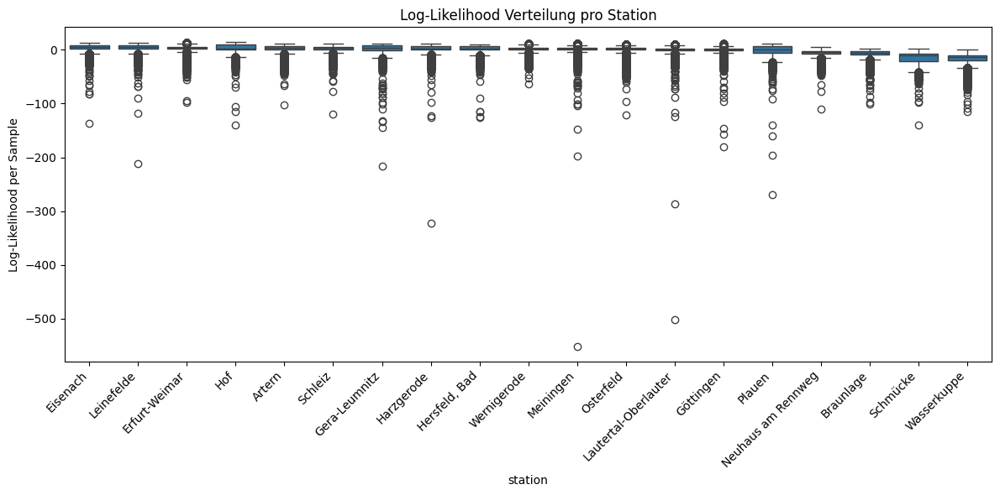

In [23]:
# Boxplot zeichnen
plt.figure(figsize=(12,6))
sns.boxplot(
    x="station", 
    y="log_likelihood", 
    data=plot_Station_logLike_df, 
    order=sorted_stations  # Sortierung nach Mean
)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Log-Likelihood per Sample")
plt.title("Log-Likelihood Verteilung pro Station")
plt.tight_layout()
plt.show()

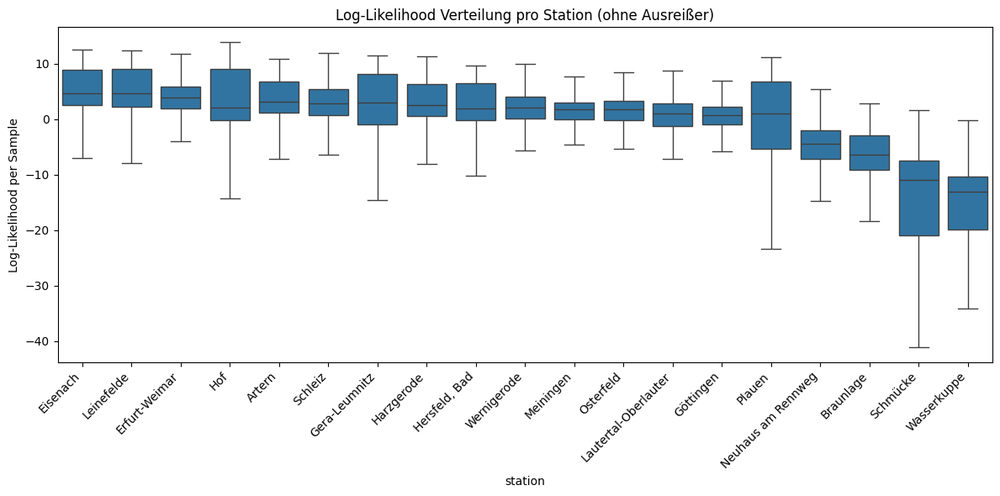

In [24]:
plt.figure(figsize=(12,6))
sns.boxplot(
    x="station", 
    y="log_likelihood", 
    data=plot_Station_logLike_df, 
    order=sorted_stations,  # Sortierung nach Mean
    showfliers=False
)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Log-Likelihood per Sample")
plt.title("Log-Likelihood Verteilung pro Station (ohne Ausreißer)")
plt.tight_layout()
plt.show()

In [25]:
#Silhouette Score

In [26]:
"""silhouette_Station_results= {}

for station in station_names:
    # Testdaten holen
    test_df = rowwiseDf.loc[datasetsIdx[station]["test_idx"]]
    X_test = test_df.drop(columns=['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).values
    # Skalieren
    X_scaled = models[station]["scaler"].transform(X_test)
    
    gmm = models[station]["gmm"]
    labels = gmm.predict(X_scaled)
    
    score = silhouette_score(X_scaled, labels)
    
    silhouette_Station_results[station] = {
        "silhouette_score": score
    }"""

'silhouette_Station_results= {}\n\nfor station in station_names:\n    # Testdaten holen\n    test_df = rowwiseDf.loc[datasetsIdx[station]["test_idx"]]\n    X_test = test_df.drop(columns=[\'MESS_DATUM\', \'Stationsname\', \'hour\', \'day\', \'month\']).values\n    # Skalieren\n    X_scaled = models[station]["scaler"].transform(X_test)\n    \n    gmm = models[station]["gmm"]\n    labels = gmm.predict(X_scaled)\n    \n    score = silhouette_score(X_scaled, labels)\n    \n    silhouette_Station_results[station] = {\n        "silhouette_score": score\n    }'

In [27]:
#df_silhouette_Station_results = pd.DataFrame(silhouette_Station_results).T  # transponieren, sodass Stationen Zeilen sind
#df_silhouette_Station_results = df_silhouette_Station_results.sort_values("silhouette_score", ascending=False)

In [28]:
#print(df_silhouette_Station_results.head(19))   # beste

In [29]:
#Regression (Entfernung zumitte/Top5 distance/Top1 distance) auf Qualität

In [30]:
entfernungsDf= rowwiseDf.drop(columns= ['MESS_DATUM', 'TT_TU', 'RF_TU', '  R1', '  P0', '   F', 'hour', 'day', 'month', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos'])
entfernungsDf= entfernungsDf.drop_duplicates()
entfernungsDf= entfernungsDf.rename(columns= {'Stationsname':'station'})
entfernungsDf= pd.merge(entfernungsDf, mean_ll, on="station", how="inner")

In [31]:
# Koordinaten in Radians für Haversine
coords = np.radians(entfernungsDf[["geoBreite", "geoLaenge"]].values)

# Ball-Tree für Haversine
nbrs = NearestNeighbors(n_neighbors=6, algorithm='ball_tree', metric='haversine').fit(coords)
distances, indices = nbrs.kneighbors(coords)

# Umrechnen in km
distances_km = distances * 6371

# Top-1 und avg 5 Distanzen (0. Spalte = sich selbst)
entfernungsDf["nearest_dist"] = distances_km[:, 1]
entfernungsDf["avg5_dist"] = distances_km[:, 1:6].mean(axis=1)

# Distanz zum Zentrum (Erfurt-Weimar)
erfurt_coords = entfernungsDf.loc[entfernungsDf["station"] == "Erfurt-Weimar", ["geoBreite","geoLaenge"]].values[0]
entfernungsDf["dist_to_zenter"] = haversine(
    entfernungsDf["geoBreite"].values,
    entfernungsDf["geoLaenge"].values,
    erfurt_coords[0],
    erfurt_coords[1]
)

In [32]:
X = entfernungsDf[["dist_to_zenter", "nearest_dist", "avg5_dist"]]
y = entfernungsDf["log_likelihood"]

# Intercept hinzufügen
X = sm.add_constant(X)

# OLS-Modell fitten
model = sm.OLS(y, X).fit()

# Ergebnisse anschauen
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:         log_likelihood   R-squared:                       0.074
Model:                            OLS   Adj. R-squared:                 -0.111
Method:                 Least Squares   F-statistic:                    0.4011
Date:                Fri, 22 Aug 2025   Prob (F-statistic):              0.754
Time:                        20:33:58   Log-Likelihood:                -58.566
No. Observations:                  19   AIC:                             125.1
Df Residuals:                      15   BIC:                             128.9
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -12.4058     12.590     -0.

c:\Users\johan\AppData\Local\Programs\Python\Python310\lib\site-packages\scipy\stats\_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=19 observations were given.
  return hypotest_fun_in(*args, **kwds)


In [33]:
#Ausgewählten Modelle

In [34]:
plot_logLike_data = []
postions= [[316, 50.9829, 10.9608], [312.0, 51.0007, 10.3621], [920.0, 50.4973, 9.9427], None]
stations= ['Eisenach', 'Erfurt-Weimar', 'Wasserkuppe', 'LastYear']

for i, sample in enumerate(stations):
    # Testdaten
    test_df = rowwiseDf.loc[datasetsIdx[sample]["test_idx"]]
    test_df= test_df.drop(columns=['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month'])
    X_test = test_df.values
    scaler= models[sample]["scaler"]
    X_scaled = scaler.transform(X_test)
    gmm = models[sample]["gmm"]
    
    log_probs_test = gmm.score_samples(X_scaled)
    plot_logLike_data.extend([{"sample": f"{sample}_test", "log_likelihood": ll} for ll in log_probs_test])
    
    # Generierte Samples
    n_gen_samples = len(X_test)  # gleiche Anzahl wie Testdaten
    # Hier: generiere zufällig aus GMM, oder nutze conditionalSampleGeneration falls gewünscht
    if postions[i] == None:
        X_gen_scaled= gmm.sample(n_gen_samples)[0]
    else:
        X_gen_scaled = conditionalSampleGeneration(gmm, postions[i], [5,6,7], test_df.columns, scaler, len(test_df.index))  # bereits skaliert im Fall von gmm.sample
    log_probs_gen = gmm.score_samples(X_gen_scaled)
    plot_logLike_data.extend([{"sample": f"{sample}_gen", "log_likelihood": ll} for ll in log_probs_gen])


In [35]:
# DataFrame
plot_logLike_df = pd.DataFrame(plot_logLike_data)

# Sortierung nach Mean (nur Testdaten berücksichtigen, um Reihenfolge zu bestimmen)
mean_ll = plot_logLike_df[plot_logLike_df['sample'].str.endswith('_test')].groupby("sample")["log_likelihood"].mean().sort_values(ascending=False)
sorted_samples = []
for s in mean_ll.index:
    sorted_samples.append(s)                # Test
    sorted_samples.append(s.replace('_test', '_gen'))  # Gen

# Spalte für Type hinzufügen
plot_logLike_df['type'] = plot_logLike_df['sample'].apply(lambda x: 'Test' if x.endswith('_test') else 'Generated')

# Optional: kürzere Sample-Namen für die x-Achse
plot_logLike_df['station'] = plot_logLike_df['sample'].apply(lambda x: x.replace('_test','').replace('_gen',''))

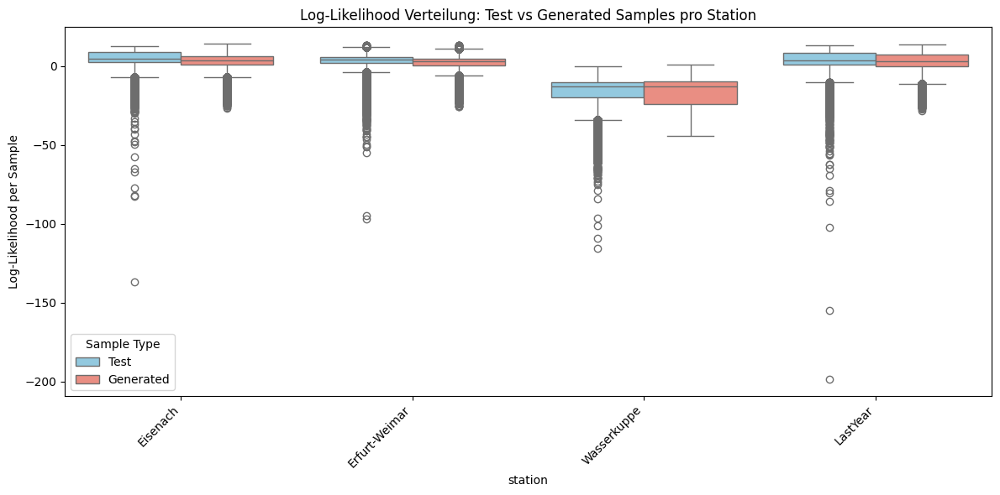

In [36]:
# Boxplot mit hue
plt.figure(figsize=(12,6))
sns.boxplot(
    x="station",
    y="log_likelihood",
    hue="type",
    data=plot_logLike_df,
    palette={"Test": "skyblue", "Generated": "salmon"}  # Farben anpassen
)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Log-Likelihood per Sample")
plt.title("Log-Likelihood Verteilung: Test vs Generated Samples pro Station")
plt.legend(title='Sample Type')
plt.tight_layout()
plt.show()

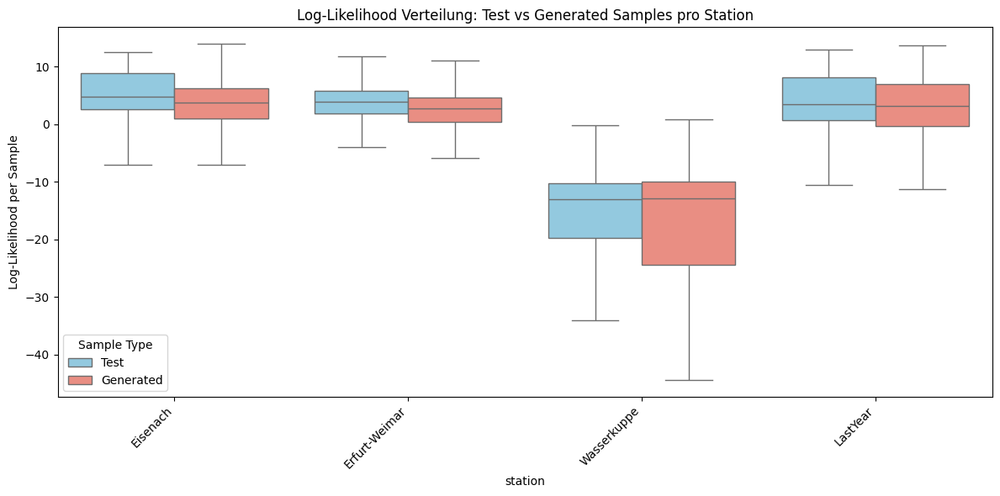

In [37]:
# Boxplot mit hue
plt.figure(figsize=(12,6))
sns.boxplot(
    x="station",
    y="log_likelihood",
    hue="type",
    data=plot_logLike_df,
    palette={"Test": "skyblue", "Generated": "salmon"},  # Farben anpassen
    showfliers=False
)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Log-Likelihood per Sample")
plt.title("Log-Likelihood Verteilung: Test vs Generated Samples pro Station")
plt.legend(title='Sample Type')
plt.tight_layout()
plt.show()

In [38]:
"""silhouette_results= {}

for station in ['Eisenach', 'Erfurt-Weimar', 'Wasserkuppe', 'LastYear']:
    # Testdaten holen
    test_df = rowwiseDf.loc[datasetsIdx[station]["test_idx"]]
    X_test = test_df.drop(columns=['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).values
    # Skalieren
    X_scaled = models[station]["scaler"].transform(X_test)
    
    gmm = models[station]["gmm"]
    labels = gmm.predict(X_scaled)
    
    score = silhouette_score(X_scaled, labels)
    
    silhouette_results[station] = {
        "silhouette_score": score
    }"""

'silhouette_results= {}\n\nfor station in [\'Eisenach\', \'Erfurt-Weimar\', \'Wasserkuppe\', \'LastYear\']:\n    # Testdaten holen\n    test_df = rowwiseDf.loc[datasetsIdx[station]["test_idx"]]\n    X_test = test_df.drop(columns=[\'MESS_DATUM\', \'Stationsname\', \'hour\', \'day\', \'month\']).values\n    # Skalieren\n    X_scaled = models[station]["scaler"].transform(X_test)\n    \n    gmm = models[station]["gmm"]\n    labels = gmm.predict(X_scaled)\n    \n    score = silhouette_score(X_scaled, labels)\n    \n    silhouette_results[station] = {\n        "silhouette_score": score\n    }'

In [39]:
"""df_silhouette_results = pd.DataFrame(silhouette_results).T  # transponieren, sodass Stationen Zeilen sind
df_silhouette_results = df_silhouette_results.sort_values("silhouette_score", ascending=False)

print(df_silhouette_results.head())   # beste"""

'df_silhouette_results = pd.DataFrame(silhouette_results).T  # transponieren, sodass Stationen Zeilen sind\ndf_silhouette_results = df_silhouette_results.sort_values("silhouette_score", ascending=False)\n\nprint(df_silhouette_results.head())   # beste'

In [40]:
#Balken Diagramme

In [41]:
#LastYear

In [42]:
test_df = rowwiseDf.loc[datasetsIdx['LastYear']["test_idx"]]
samples, _ = models['LastYear']["gmm"].sample(len(test_df.index))
samplesOriginal= models['LastYear']['scaler'].inverse_transform(samples)
lastYearGeneratedDf= pd.DataFrame(samplesOriginal, columns= ['TT_TU', 'RF_TU', '  R1', '  P0', '   F', 'Stationshoehe', 'geoBreite', 'geoLaenge', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos'])

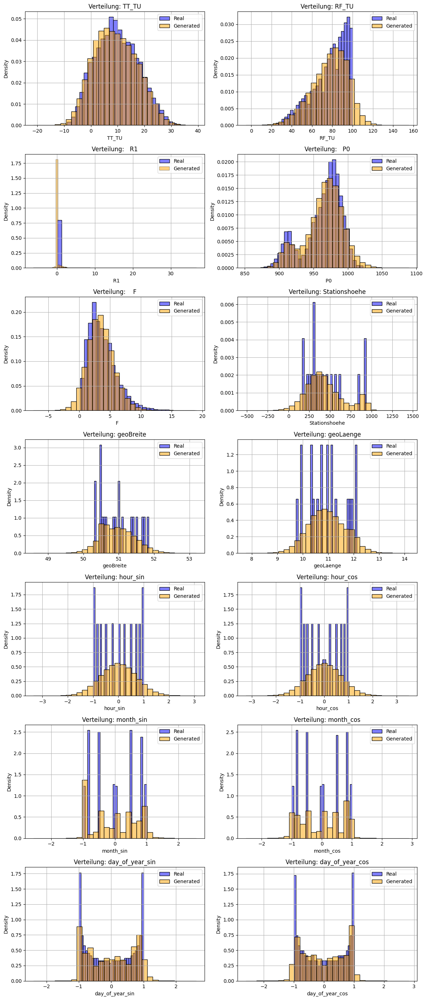

In [43]:
plot_feature_distributions(test_df, lastYearGeneratedDf, ['TT_TU', 'RF_TU', '  R1', '  P0', '   F', 'Stationshoehe', 'geoBreite', 'geoLaenge', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos'])

In [44]:
# Erfurt-Weimar

In [45]:
tmpDf= rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month'])
test_df= tmpDf.loc[datasetsIdx['Erfurt-Weimar']["test_idx"]]
samples= conditionalSampleGeneration(models['Erfurt-Weimar']['gmm'], [316, 50.9829, 10.9608], [5,6,7], tmpDf.columns, models['Erfurt-Weimar']['scaler'], len(test_df.index))
samplesOriginal= models['Erfurt-Weimar']['scaler'].inverse_transform(samples)
erfurtWeimarGeneratedDf= pd.DataFrame(samplesOriginal, columns= ['TT_TU', 'RF_TU', '  R1', '  P0', '   F', 'Stationshoehe', 'geoBreite', 'geoLaenge', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos'])

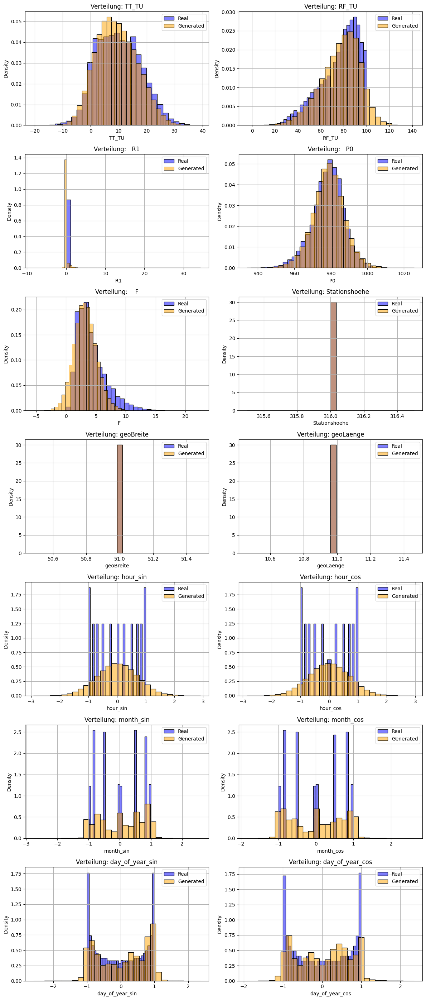

In [46]:
plot_feature_distributions(test_df, erfurtWeimarGeneratedDf, ['TT_TU', 'RF_TU', '  R1', '  P0', '   F', 'Stationshoehe', 'geoBreite', 'geoLaenge', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos'])

In [47]:
# Eisenach

In [48]:
tmpDf= rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month'])
test_df= tmpDf.loc[datasetsIdx['Eisenach']["test_idx"]]
samples= conditionalSampleGeneration(models['Eisenach']['gmm'], [312.0, 51.0007, 10.3621], [5,6,7], tmpDf.columns, models['Eisenach']['scaler'], len(test_df.index))
samplesOriginal= models['Eisenach']['scaler'].inverse_transform(samples)
eisenachGeneratedDf= pd.DataFrame(samplesOriginal, columns= ['TT_TU', 'RF_TU', '  R1', '  P0', '   F', 'Stationshoehe', 'geoBreite', 'geoLaenge', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos'])

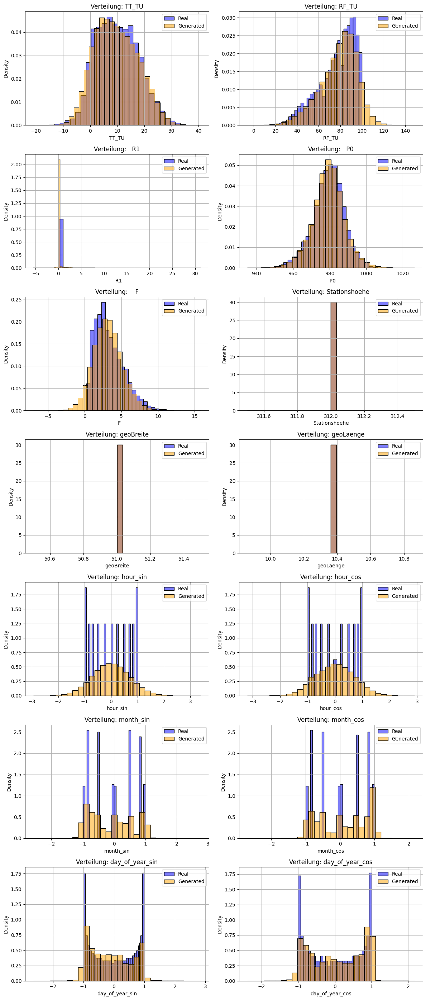

In [49]:
plot_feature_distributions(test_df, eisenachGeneratedDf, ['TT_TU', 'RF_TU', '  R1', '  P0', '   F', 'Stationshoehe', 'geoBreite', 'geoLaenge', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos'])

In [50]:
# Wasserkuppe

In [51]:
tmpDf= rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month'])
test_df= tmpDf.loc[datasetsIdx['Wasserkuppe']["test_idx"]]
samples= conditionalSampleGeneration(models['Wasserkuppe']['gmm'], [920.0, 50.4973, 9.9427], [5,6,7], tmpDf.columns, models['Wasserkuppe']['scaler'], len(test_df.index))
samplesOriginal= models['Wasserkuppe']['scaler'].inverse_transform(samples)
wasserkuppeGeneratedDf= pd.DataFrame(samplesOriginal, columns= ['TT_TU', 'RF_TU', '  R1', '  P0', '   F', 'Stationshoehe', 'geoBreite', 'geoLaenge', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos'])

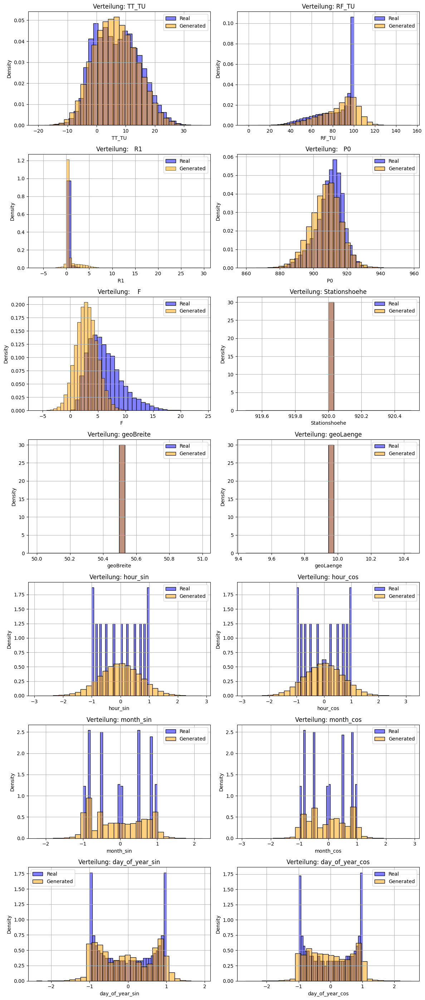

In [52]:
plot_feature_distributions(test_df, wasserkuppeGeneratedDf, ['TT_TU', 'RF_TU', '  R1', '  P0', '   F', 'Stationshoehe', 'geoBreite', 'geoLaenge', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos'])

In [53]:
#MSE

In [54]:
#LastYear

In [55]:
maxDate = rowwiseDf['MESS_DATUM'].max()
cutoffDate = maxDate - pd.DateOffset(years=1)
testLastYearDf = rowwiseDf[rowwiseDf['MESS_DATUM'] >= cutoffDate]
trainLastYearDf = rowwiseDf[rowwiseDf['MESS_DATUM'] < cutoffDate]

In [56]:
linearModels, realMse, syntheticMse= RidgeRegression(['TT_TU', 'RF_TU', '  R1', '  P0', '   F'], lastYearGeneratedDf.columns, trainLastYearDf, testLastYearDf, lastYearGeneratedDf)

Real Target: TT_TU - MSE: 13.543035704063428
Synthetic Target: TT_TU - MSE: 13.214281951592987
Real Target: RF_TU - MSE: 135.74258315814856
Synthetic Target: RF_TU - MSE: 143.1811751582931
Real Target: R1 - MSE: 0.281140511960536
Synthetic Target: R1 - MSE: 0.22967047287300196
Real Target: P0 - MSE: 79.56710306184122
Synthetic Target: P0 - MSE: 62.97500090277848
Real Target: F - MSE: 3.752565040969413
Synthetic Target: F - MSE: 3.5715936498993837


In [57]:
features = ['TT_TU', 'RF_TU', 'R1', 'P0', 'F']

mseComparer = pd.DataFrame({
    'Feature': features,
    'MSE_Real': realMse,
    'MSE_Synthetic': syntheticMse,
})
mseComparer["Delta (%)"] = 100 * (mseComparer["MSE_Synthetic"] - mseComparer["MSE_Real"]) / mseComparer["MSE_Real"]

print(mseComparer.round(4))

  Feature  MSE_Real  MSE_Synthetic  Delta (%)
0   TT_TU   13.5430        13.2143    -2.4275
1   RF_TU  135.7426       143.1812     5.4799
2      R1    0.2811         0.2297   -18.3076
3      P0   79.5671        62.9750   -20.8530
4       F    3.7526         3.5716    -4.8226


In [58]:
#Erfurt-Weimar

In [59]:
trainErfurtWeimarDf= rowwiseDf[rowwiseDf['Stationsname'] != 'Erfurt-Weimar']
testErfurtWeimarDf= rowwiseDf[rowwiseDf['Stationsname'] == 'Erfurt-Weimar']

In [60]:
linearModels, realMse, syntheticMse= RidgeRegression(['TT_TU', 'RF_TU', '  R1', '  P0', '   F'], erfurtWeimarGeneratedDf.columns, trainErfurtWeimarDf, testErfurtWeimarDf, erfurtWeimarGeneratedDf)

Real Target: TT_TU - MSE: 13.051708680015553
Synthetic Target: TT_TU - MSE: 13.451357622956024
Real Target: RF_TU - MSE: 133.3703068652657
Synthetic Target: RF_TU - MSE: 135.86266088063215
Real Target: R1 - MSE: 0.21603859730398736
Synthetic Target: R1 - MSE: 0.25664255796373026
Real Target: P0 - MSE: 66.52578255018058
Synthetic Target: P0 - MSE: 68.12137781494178
Real Target: F - MSE: 5.829525546586899
Synthetic Target: F - MSE: 2.9588353760956383


In [61]:
features = ['TT_TU', 'RF_TU', 'R1', 'P0', 'F']

mseComparer = pd.DataFrame({
    'Feature': features,
    'MSE_Real': realMse,
    'MSE_Synthetic': syntheticMse,
})
mseComparer["Delta (%)"] = 100 * (mseComparer["MSE_Synthetic"] - mseComparer["MSE_Real"]) / mseComparer["MSE_Real"]

print(mseComparer.round(4))

  Feature  MSE_Real  MSE_Synthetic  Delta (%)
0   TT_TU   13.0517        13.4514     3.0620
1   RF_TU  133.3703       135.8627     1.8687
2      R1    0.2160         0.2566    18.7948
3      P0   66.5258        68.1214     2.3985
4       F    5.8295         2.9588   -49.2440


In [62]:
#Eisenach

In [63]:
trainEisenachDf= rowwiseDf[rowwiseDf['Stationsname'] != 'Eisenach']
testEisenachDf= rowwiseDf[rowwiseDf['Stationsname'] == 'Eisenach']

In [64]:
linearModels, realMse, syntheticMse= RidgeRegression(['TT_TU', 'RF_TU', '  R1', '  P0', '   F'], eisenachGeneratedDf.columns, trainEisenachDf, testEisenachDf, eisenachGeneratedDf)

Real Target: TT_TU - MSE: 13.133533710385429
Synthetic Target: TT_TU - MSE: 13.277114509884662
Real Target: RF_TU - MSE: 129.6821061047119
Synthetic Target: RF_TU - MSE: 134.60830990572896
Real Target: R1 - MSE: 0.20600276649205126
Synthetic Target: R1 - MSE: 0.21275741935152778
Real Target: P0 - MSE: 68.21375251100807
Synthetic Target: P0 - MSE: 68.53180864455486
Real Target: F - MSE: 2.9594602519614153
Synthetic Target: F - MSE: 3.153560466850366


In [65]:
features = ['TT_TU', 'RF_TU', 'R1', 'P0', 'F']

mseComparer = pd.DataFrame({
    'Feature': features,
    'MSE_Real': realMse,
    'MSE_Synthetic': syntheticMse,
})
mseComparer["Delta (%)"] = 100 * (mseComparer["MSE_Synthetic"] - mseComparer["MSE_Real"]) / mseComparer["MSE_Real"]

print(mseComparer.round(4))

  Feature  MSE_Real  MSE_Synthetic  Delta (%)
0   TT_TU   13.1335        13.2771     1.0932
1   RF_TU  129.6821       134.6083     3.7987
2      R1    0.2060         0.2128     3.2789
3      P0   68.2138        68.5318     0.4663
4       F    2.9595         3.1536     6.5586


In [66]:
#Wasserkuppe

In [67]:
trainWasserkuppeDf= rowwiseDf[rowwiseDf['Stationsname'] != 'Wasserkuppe']
testWasserkuppeDf= rowwiseDf[rowwiseDf['Stationsname'] == 'Wasserkuppe']

In [68]:
linearModels, realMse, syntheticMse= RidgeRegression(['TT_TU', 'RF_TU', '  R1', '  P0', '   F'], wasserkuppeGeneratedDf.columns, trainWasserkuppeDf, testWasserkuppeDf, wasserkuppeGeneratedDf)

Real Target: TT_TU - MSE: 13.833472274115046
Synthetic Target: TT_TU - MSE: 12.519014607523365
Real Target: RF_TU - MSE: 201.56052012972603
Synthetic Target: RF_TU - MSE: 144.30079292781033
Real Target: R1 - MSE: 0.3442798039220696
Synthetic Target: R1 - MSE: 2.1544561353251965
Real Target: P0 - MSE: 63.04477932965046
Synthetic Target: P0 - MSE: 73.08395215470952
Real Target: F - MSE: 14.158299311546969
Synthetic Target: F - MSE: 4.436122979395113


In [69]:
features = ['TT_TU', 'RF_TU', 'R1', 'P0', 'F']

mseComparer = pd.DataFrame({
    'Feature': features,
    'MSE_Real': realMse,
    'MSE_Synthetic': syntheticMse,
})
mseComparer["Delta (%)"] = 100 * (mseComparer["MSE_Synthetic"] - mseComparer["MSE_Real"]) / mseComparer["MSE_Real"]

print(mseComparer.round(4))

  Feature  MSE_Real  MSE_Synthetic  Delta (%)
0   TT_TU   13.8335        12.5190    -9.5020
1   RF_TU  201.5605       144.3008   -28.4082
2      R1    0.3443         2.1545   525.7864
3      P0   63.0448        73.0840    15.9239
4       F   14.1583         4.4361   -68.6677


In [70]:
#Kompuneten Analyse

In [71]:
#LastYear

In [72]:
clusterMeans= pd.DataFrame(models['LastYear']['gmm']. means_, columns= lastYearGeneratedDf.columns)

In [73]:
covs = models['LastYear']['gmm'].covariances_

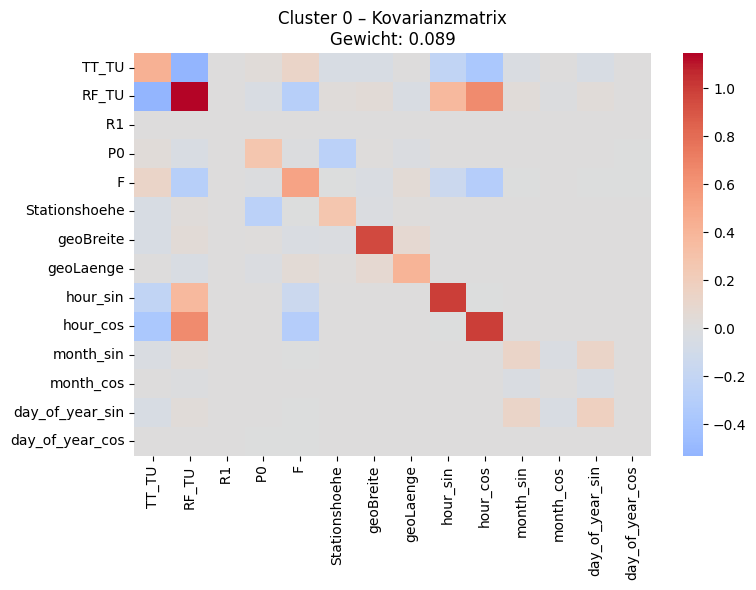

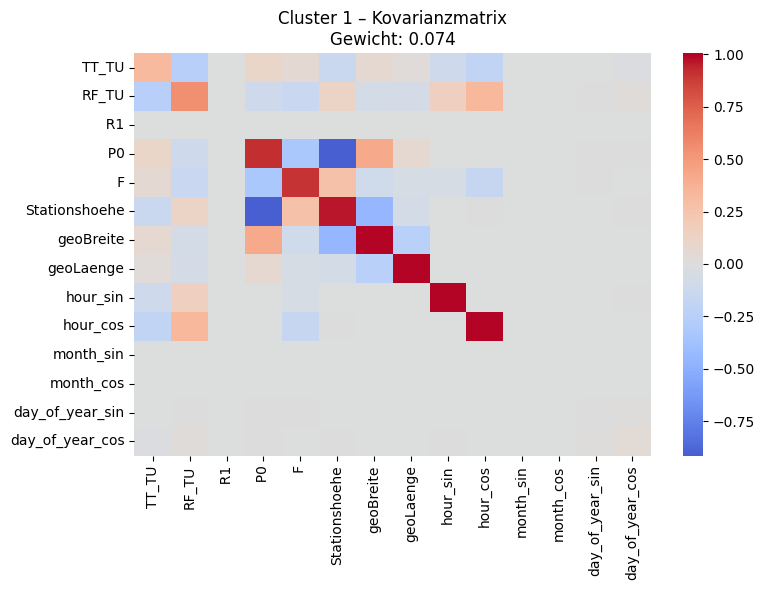

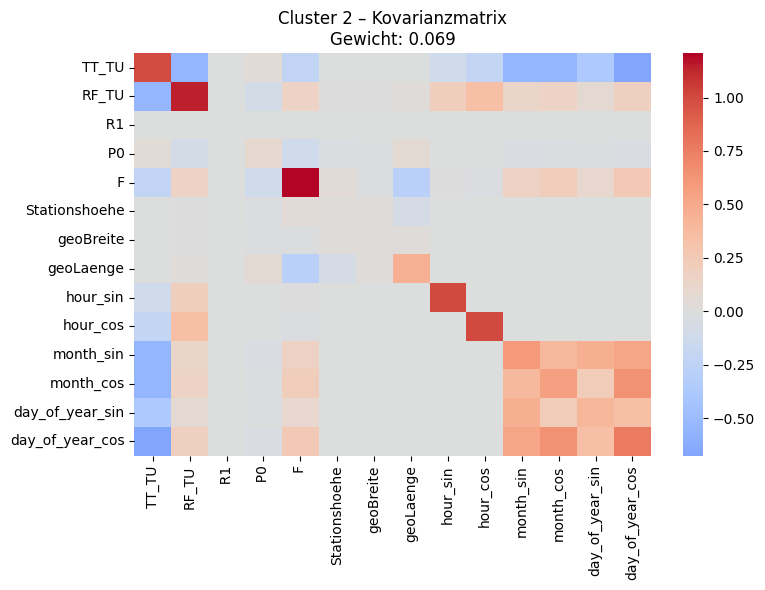

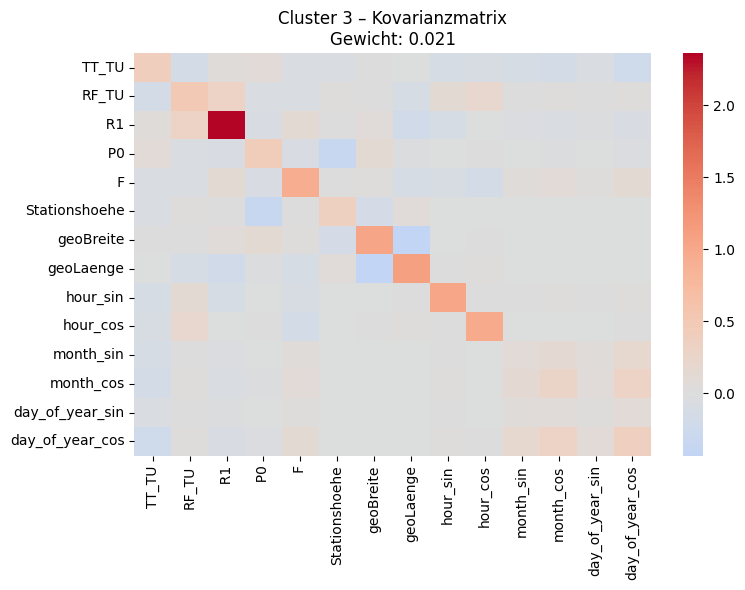

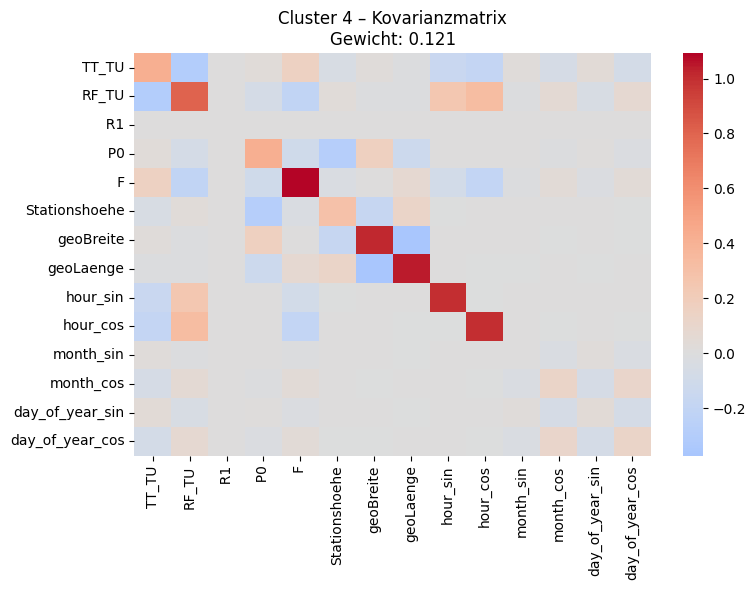

...

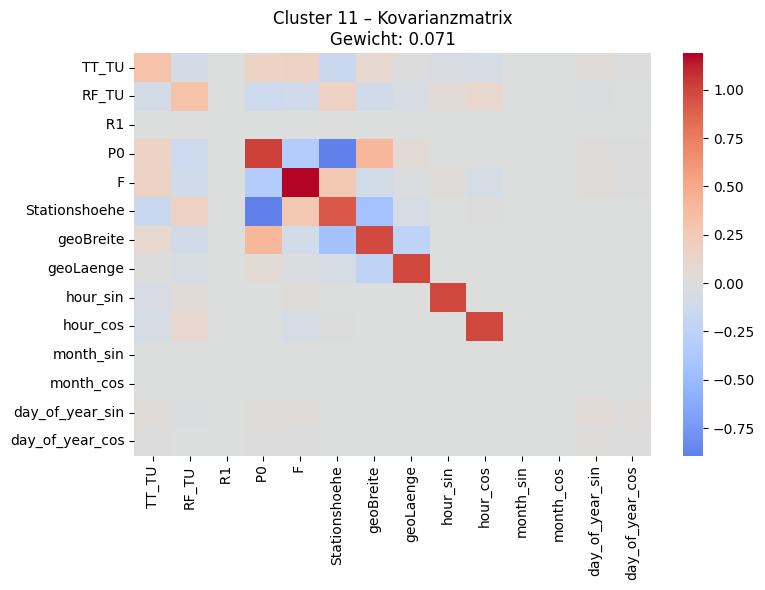

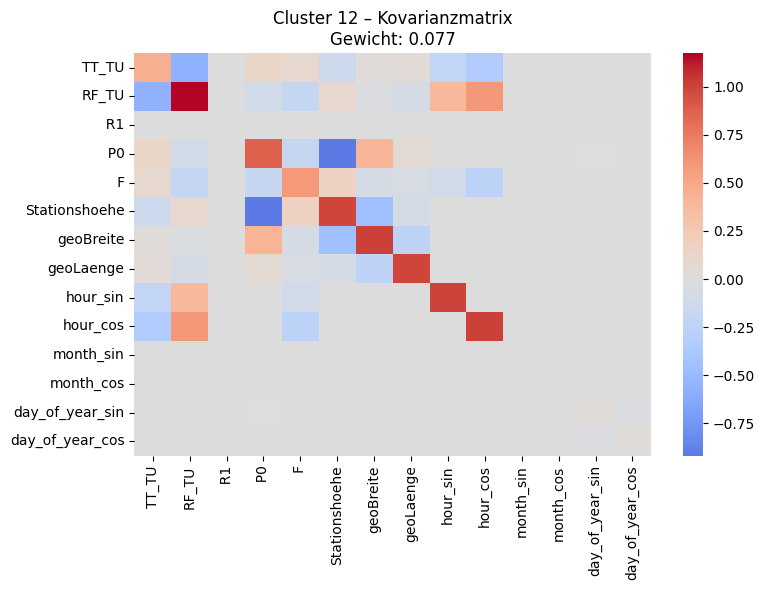

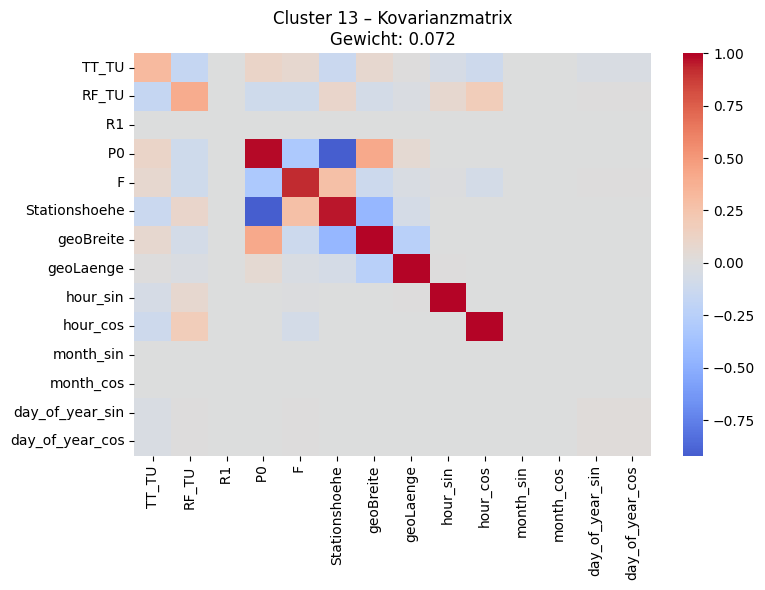

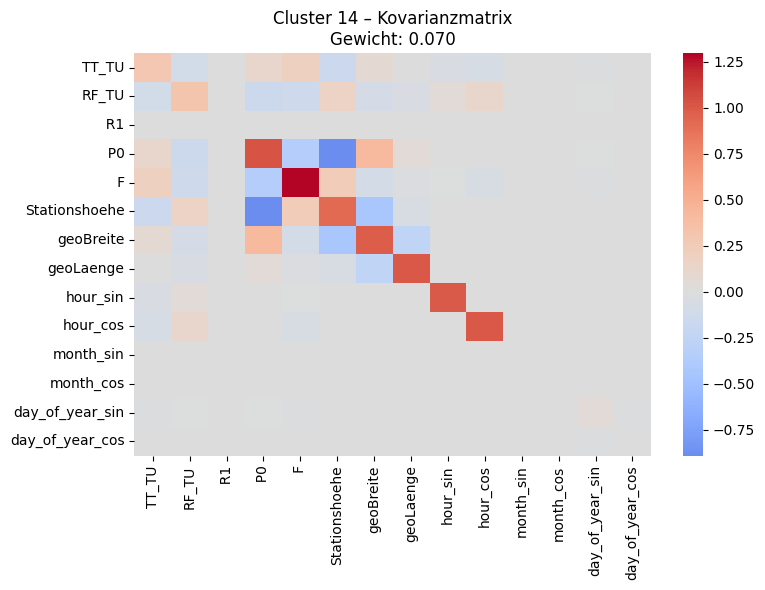

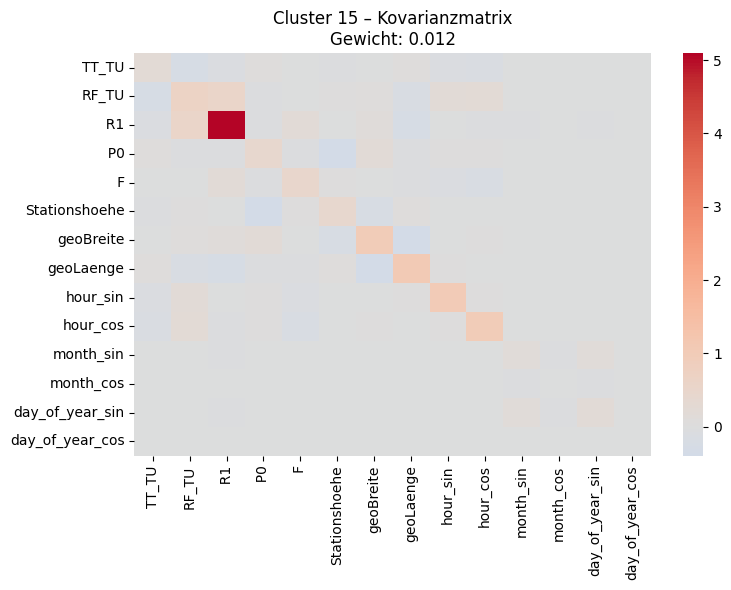

In [74]:
plot_gmm_covariances(models['LastYear']['gmm'], lastYearGeneratedDf.columns)

In [75]:
weights = models['LastYear']['gmm'].weights_
print(weights)

[0.08947002 0.0740931  0.06850198 0.02099011 0.12116638 0.0745841
 0.12762814 0.02858142 0.02432142 0.03885031 0.03002567 0.07137258
 0.07654814 0.07195231 0.06965636 0.01225795]


In [76]:
#Erfurt-Weimar

In [77]:
clusterMeans= pd.DataFrame(models['Erfurt-Weimar']['gmm']. means_, columns= lastYearGeneratedDf.columns)

In [78]:
covs = models['Erfurt-Weimar']['gmm'].covariances_

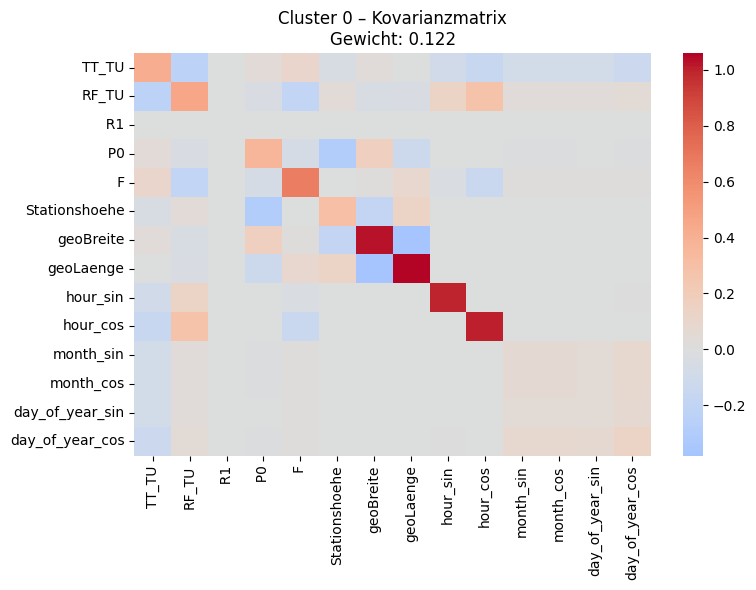

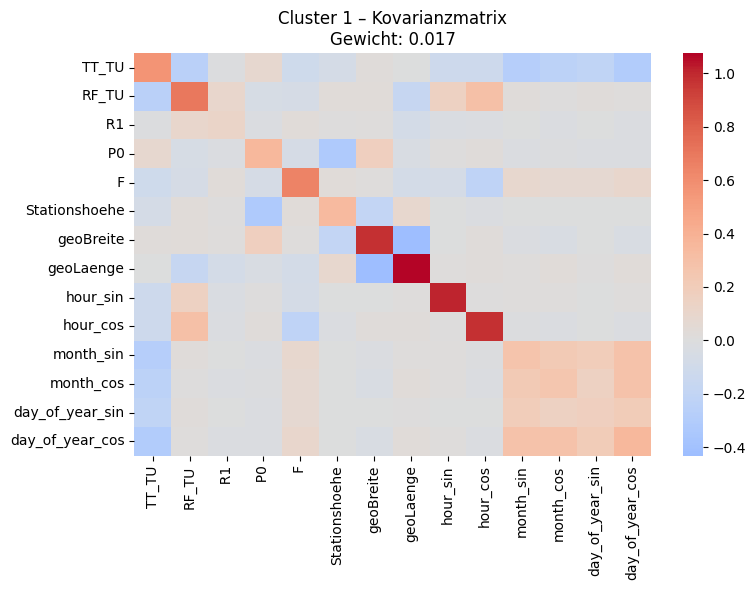

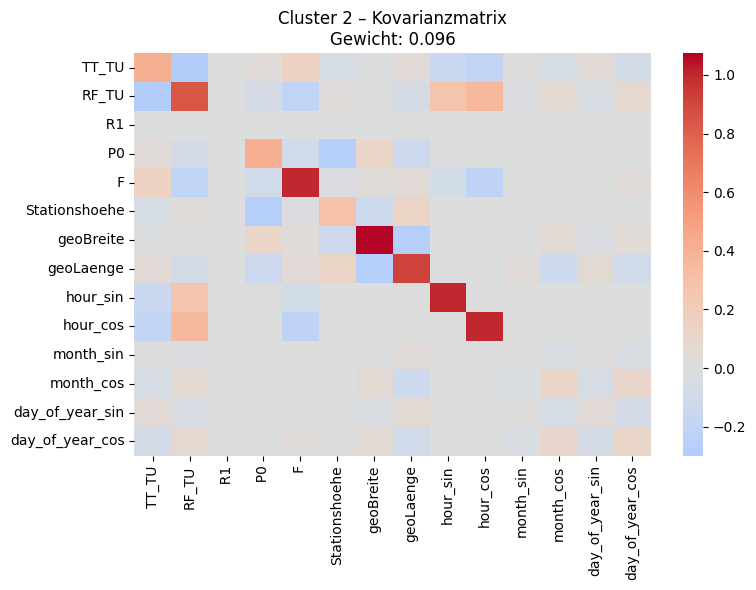

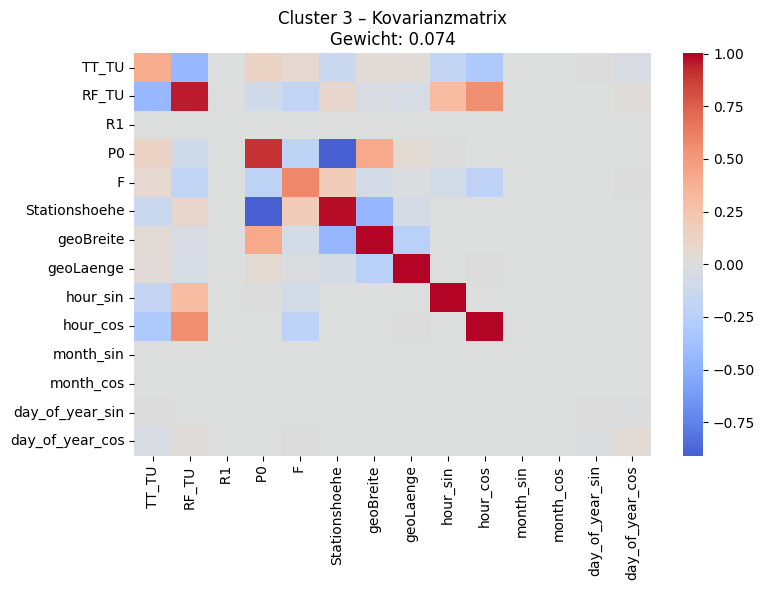

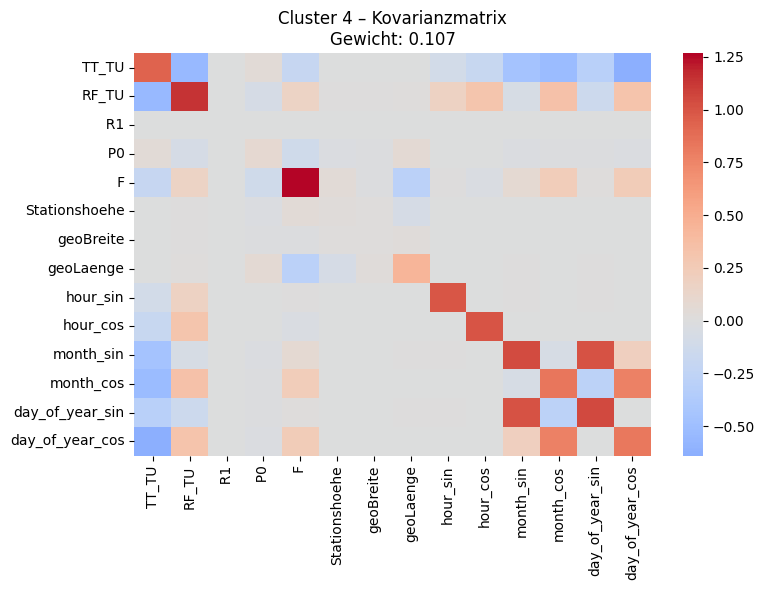

...

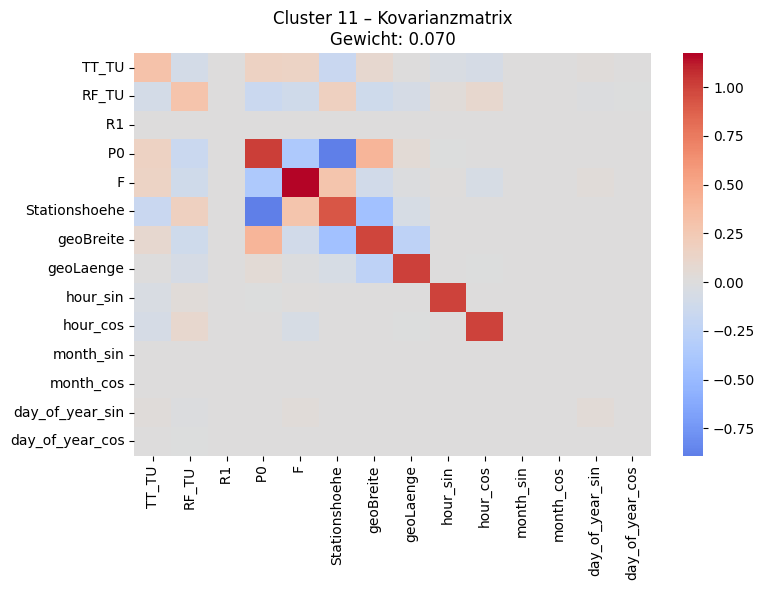

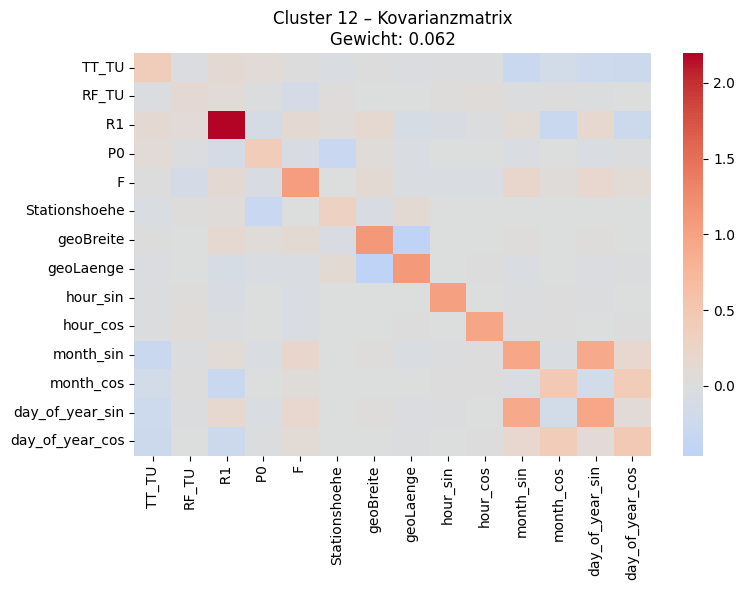

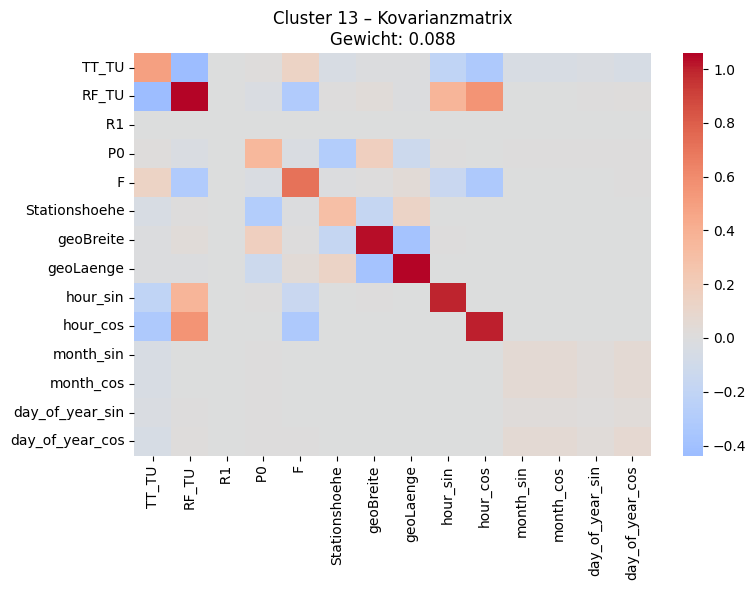

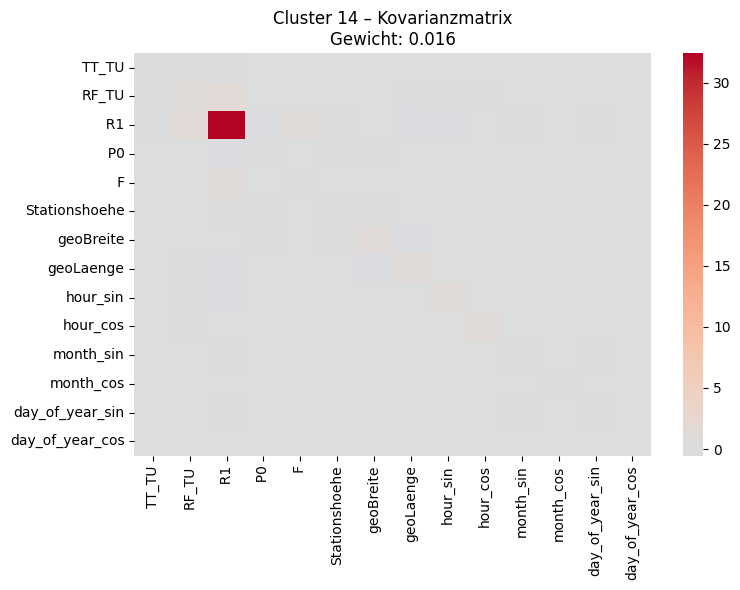

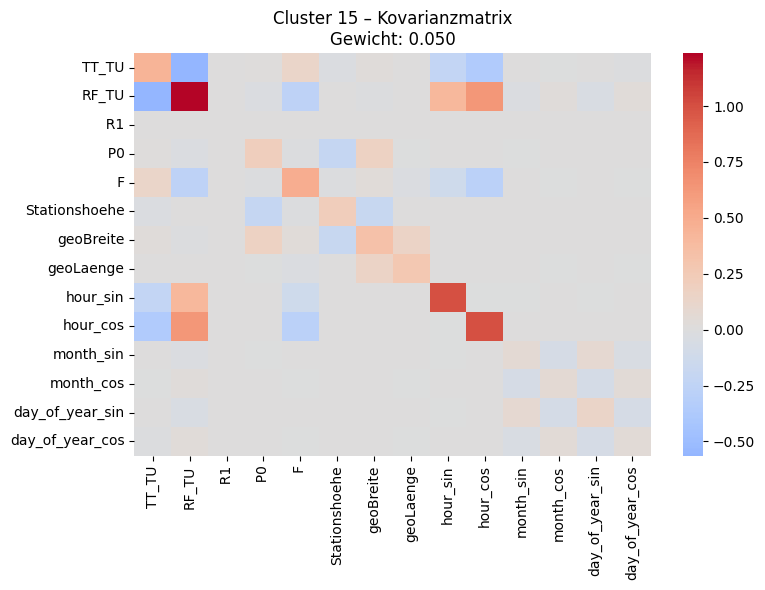

In [79]:
plot_gmm_covariances(models['Erfurt-Weimar']['gmm'], lastYearGeneratedDf.columns)

In [80]:
weights = models['Erfurt-Weimar']['gmm'].weights_

In [81]:
#Eisenach

In [82]:
clusterMeans= pd.DataFrame(models['Eisenach']['gmm']. means_, columns= lastYearGeneratedDf.columns)

In [83]:
covs = models['Eisenach']['gmm'].covariances_

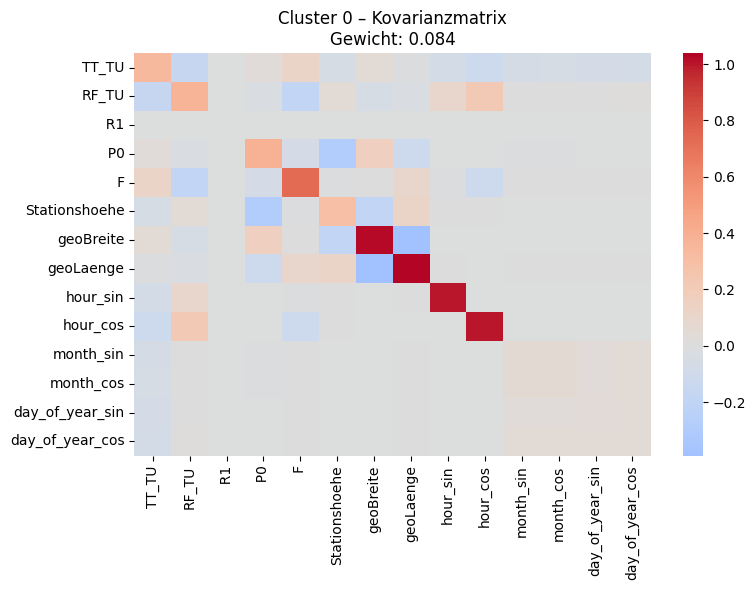

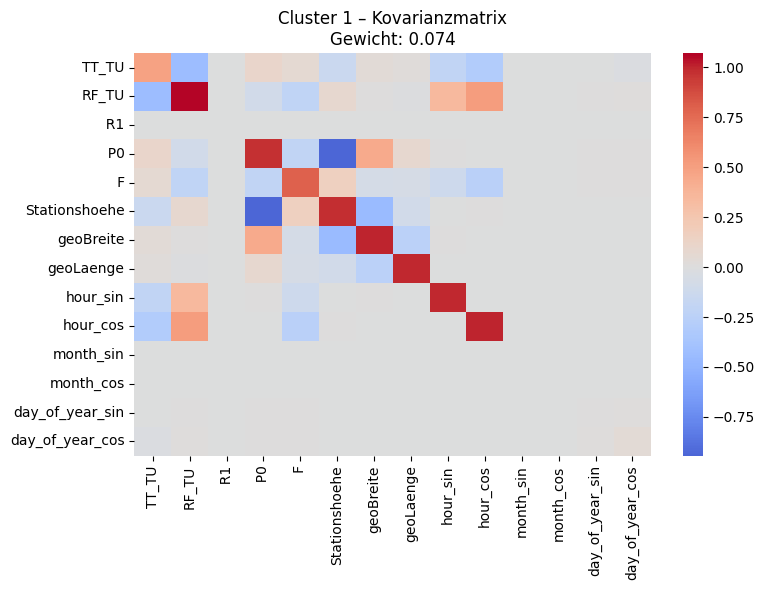

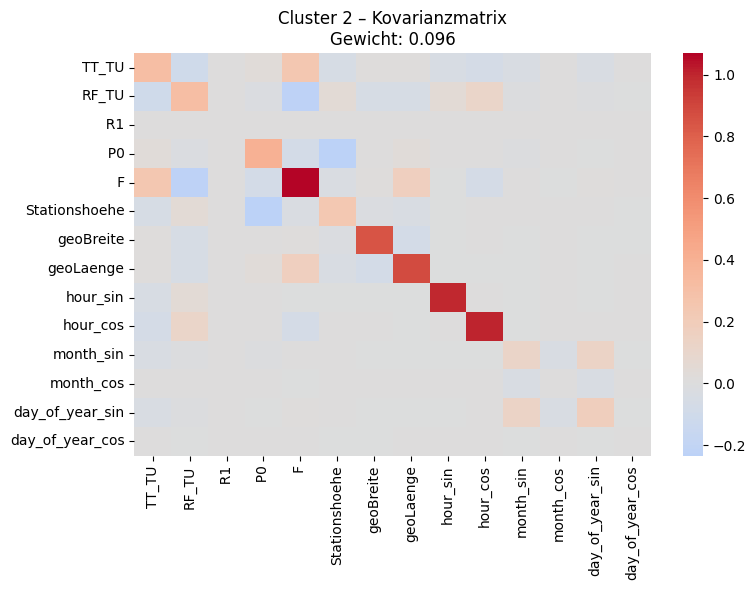

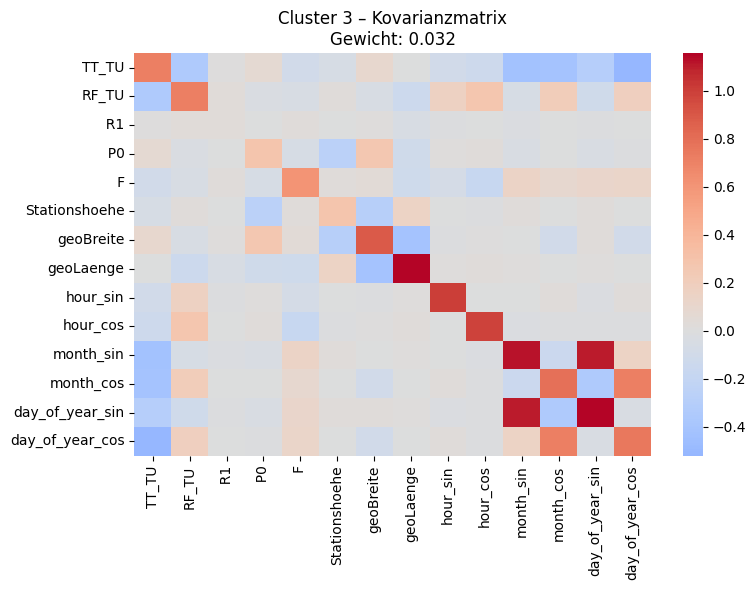

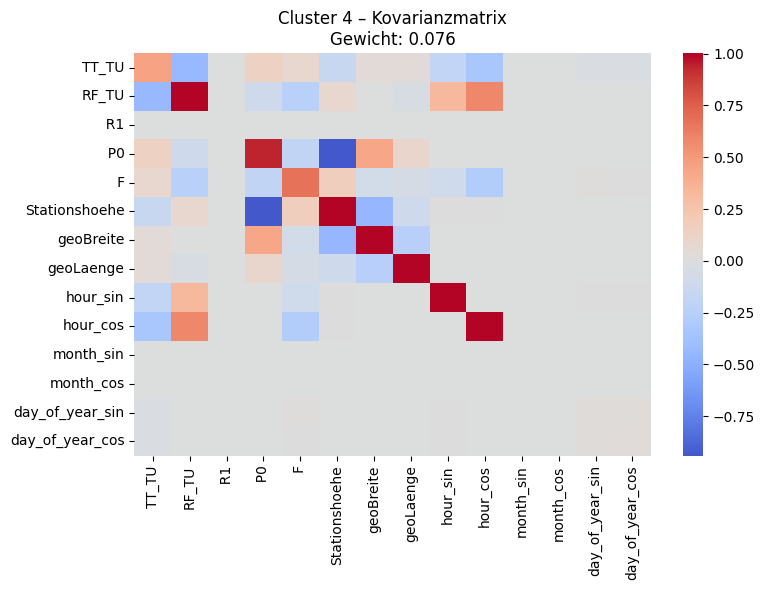

...

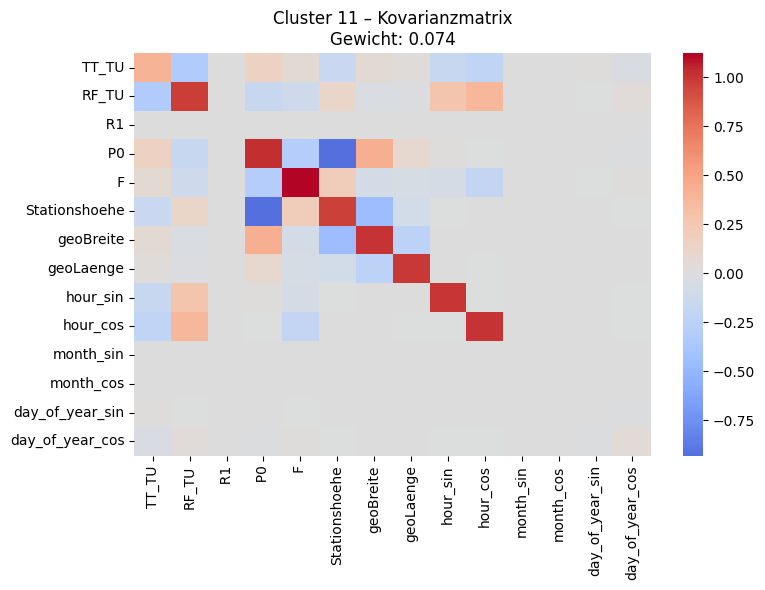

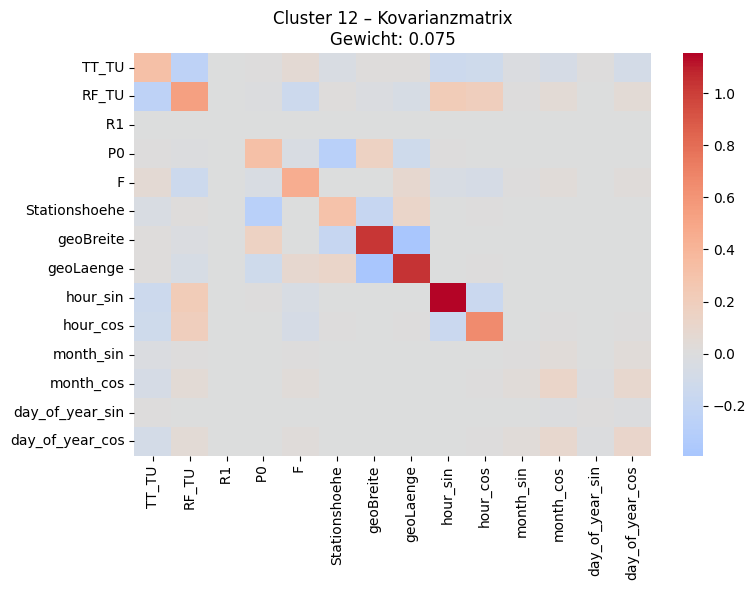

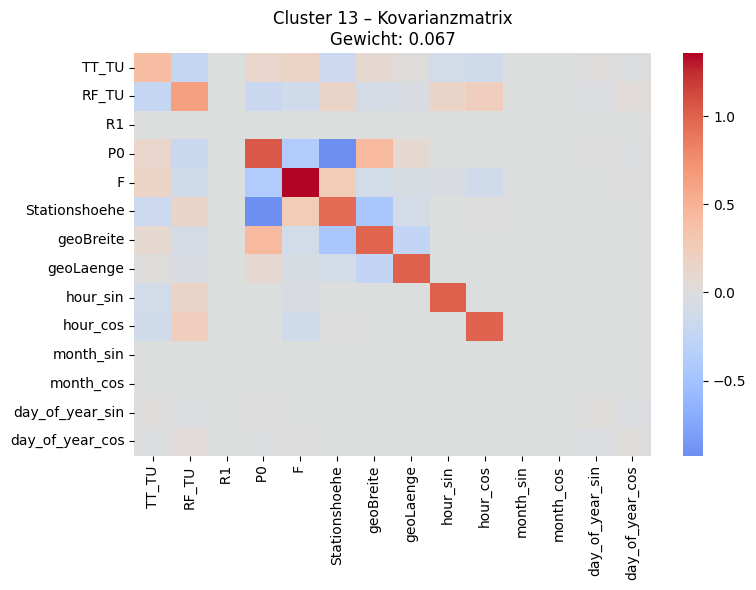

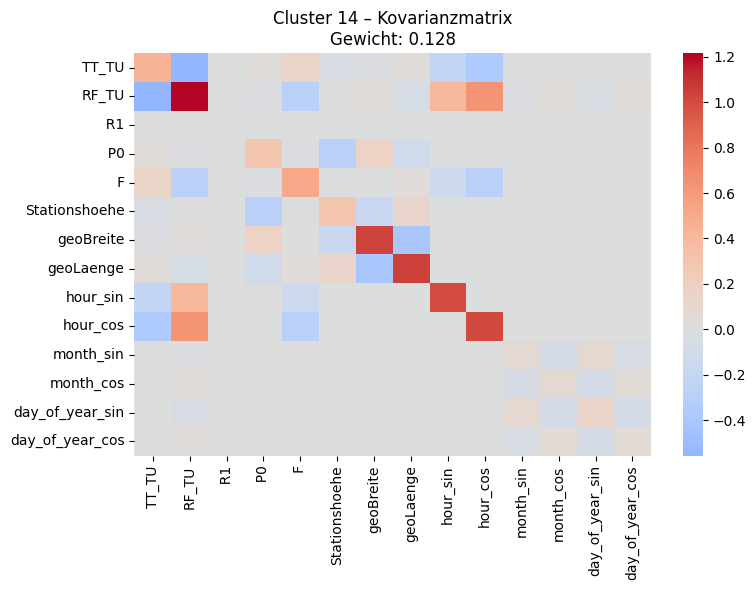

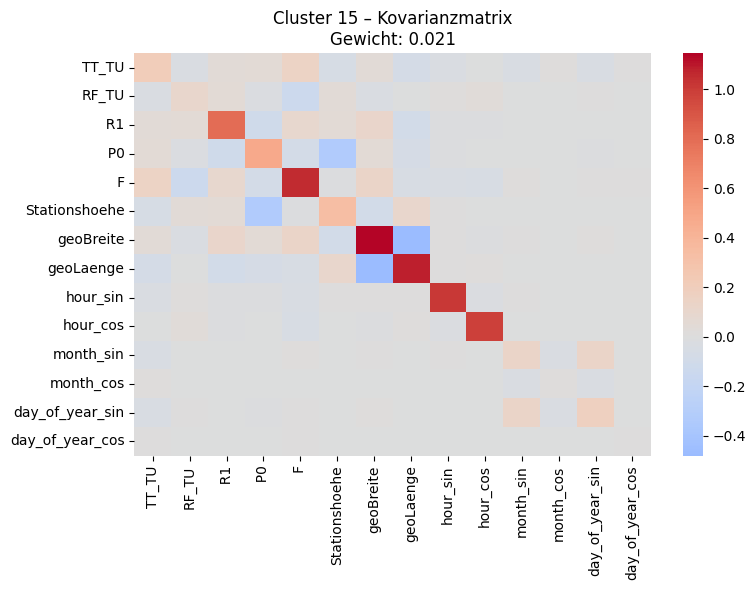

In [84]:
plot_gmm_covariances(models['Eisenach']['gmm'], lastYearGeneratedDf.columns)

In [85]:
weights = models['Eisenach']['gmm'].weights_

In [86]:
#Wasserkuppe

In [87]:
clusterMeans= pd.DataFrame(models['Wasserkuppe']['gmm']. means_, columns= lastYearGeneratedDf.columns)

In [88]:
covs = models['Wasserkuppe']['gmm'].covariances_

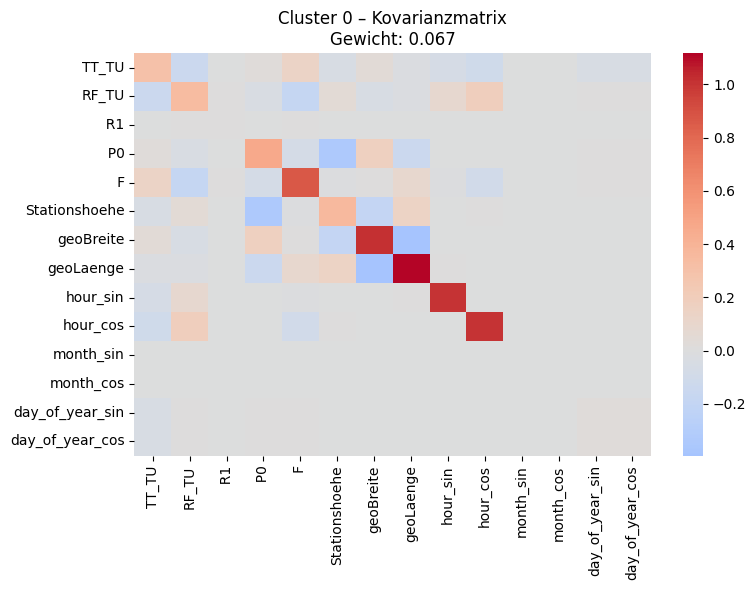

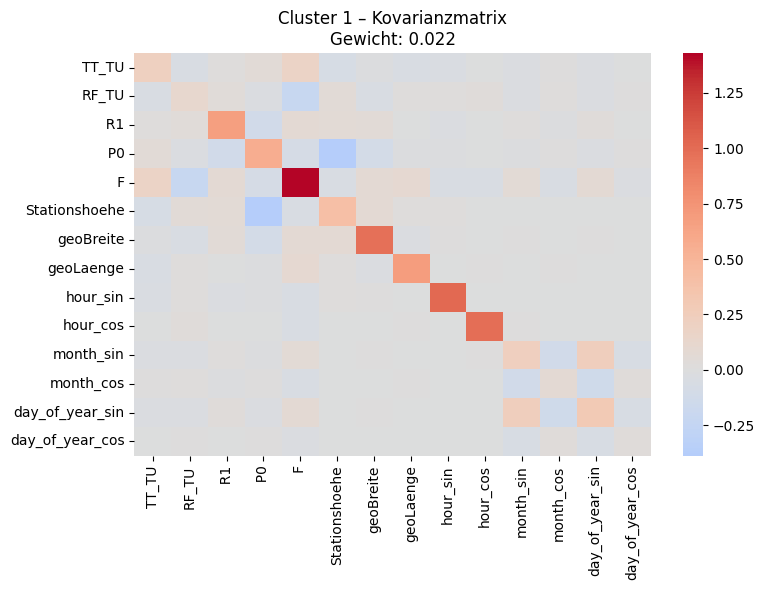

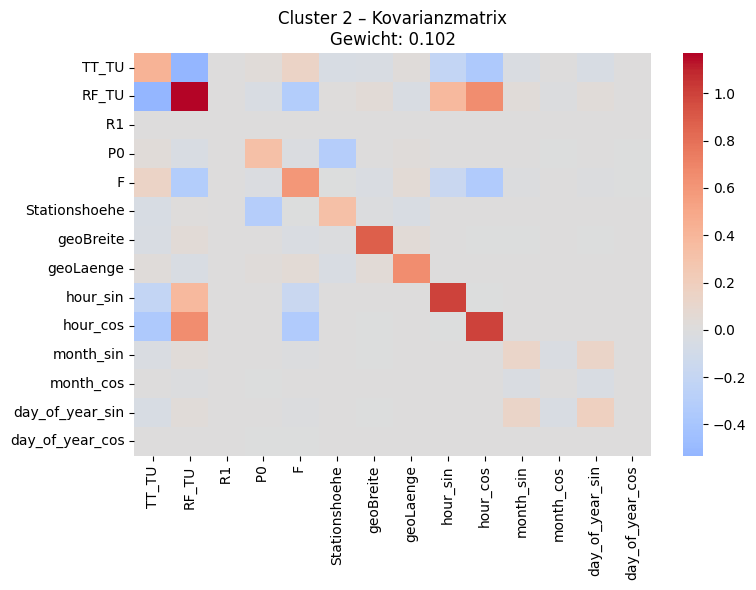

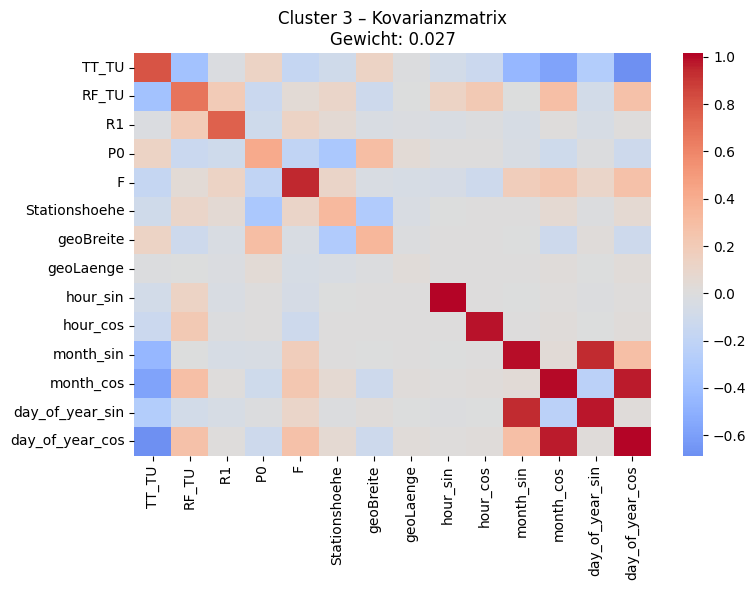

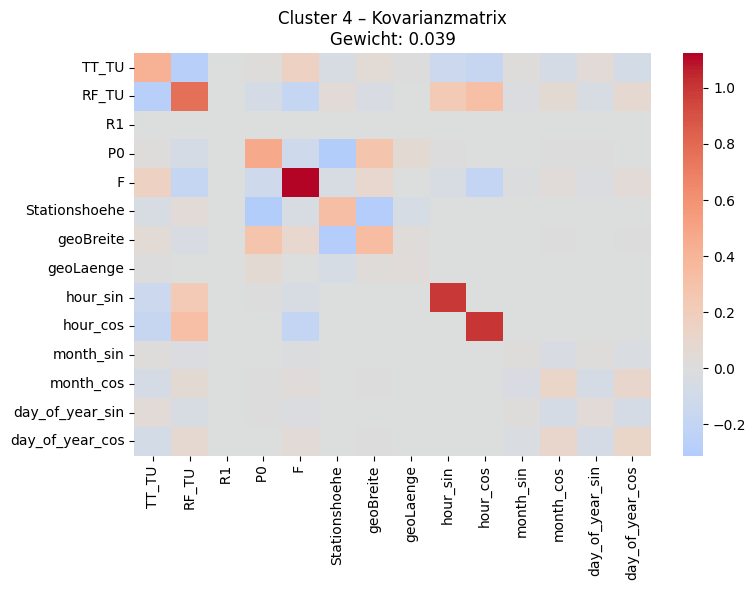

...

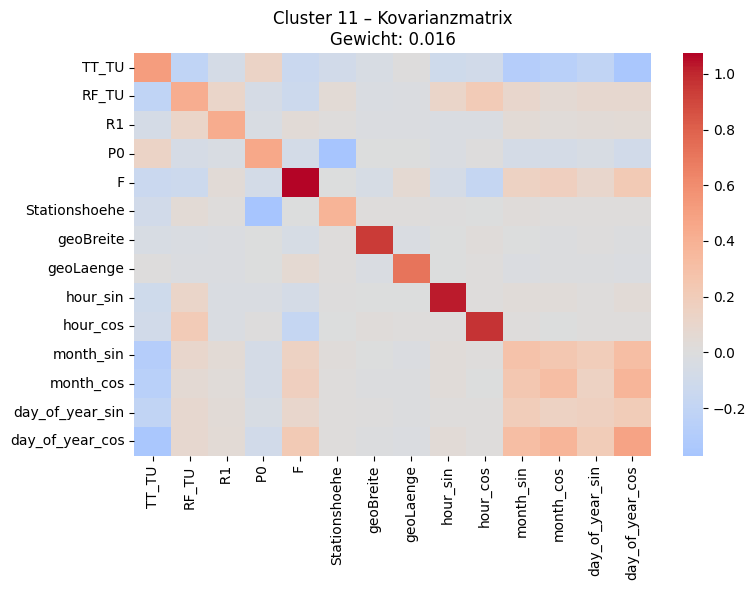

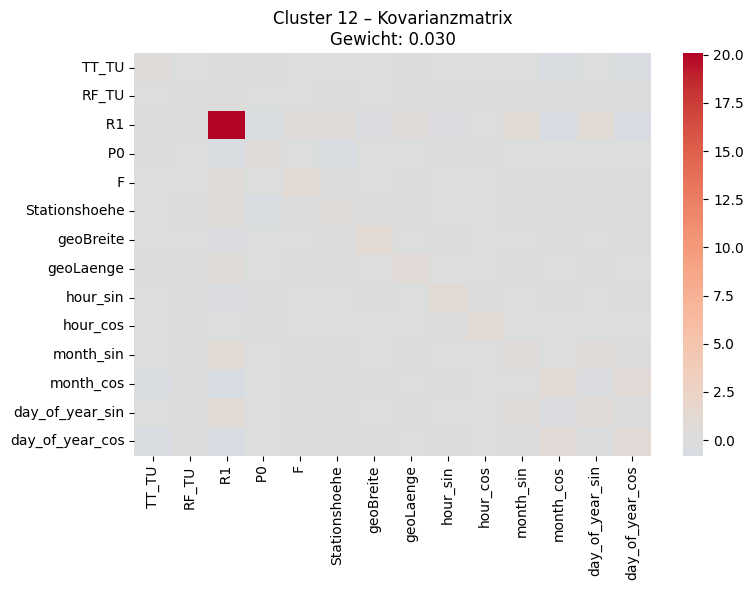

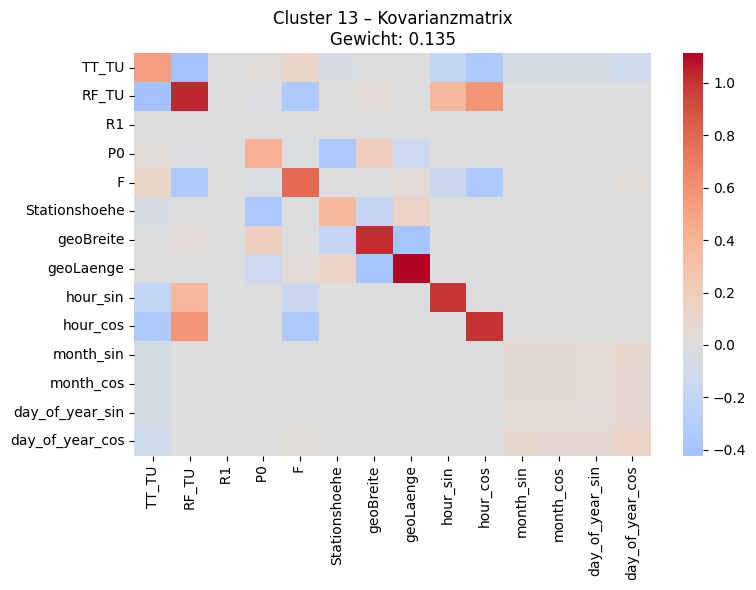

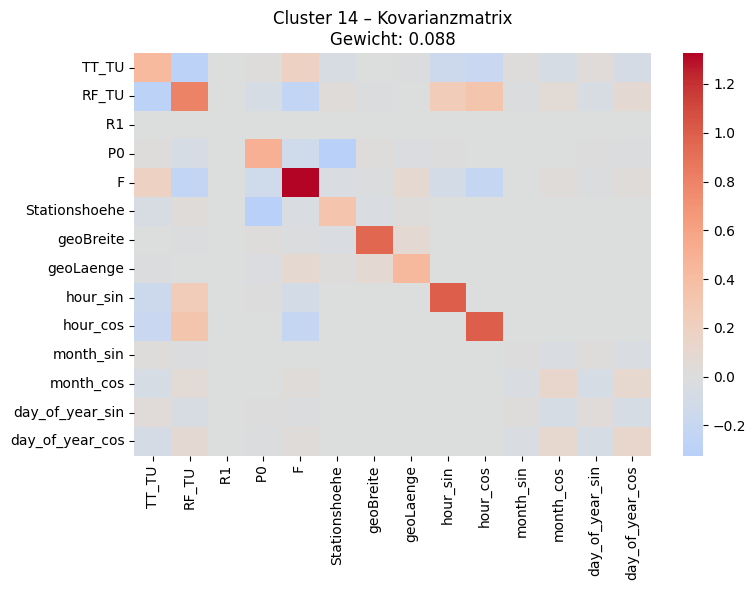

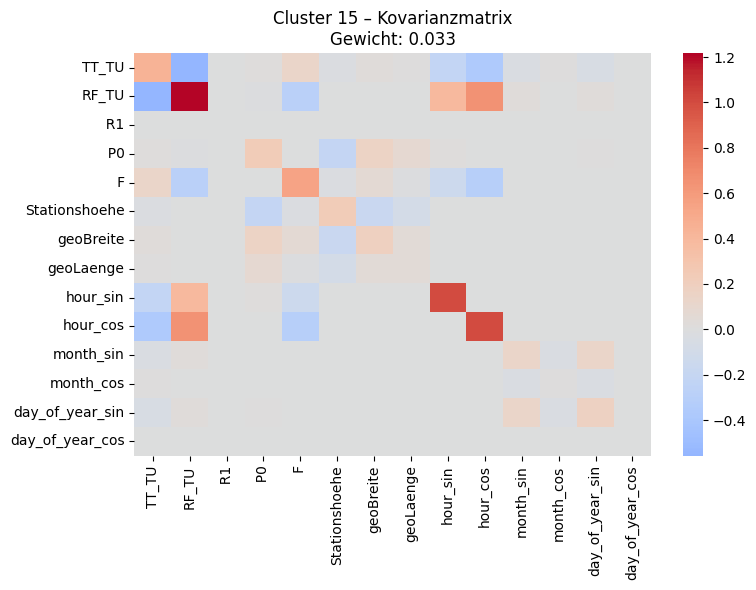

In [89]:
plot_gmm_covariances(models['Wasserkuppe']['gmm'], lastYearGeneratedDf.columns)

In [90]:
weights = models['Wasserkuppe']['gmm'].weights_

In [91]:
#Kompuneten Summary

In [92]:
#LastYear

In [93]:
X= models['LastYear']['scaler'].transform(trainLastYearDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).values)
labels= models['LastYear']['gmm'].predict(X)
XOriginal= models['LastYear']['scaler'].inverse_transform(X)

In [94]:
summary_df = cluster_summary_bootstrap(XOriginal, labels, lastYearGeneratedDf.columns)

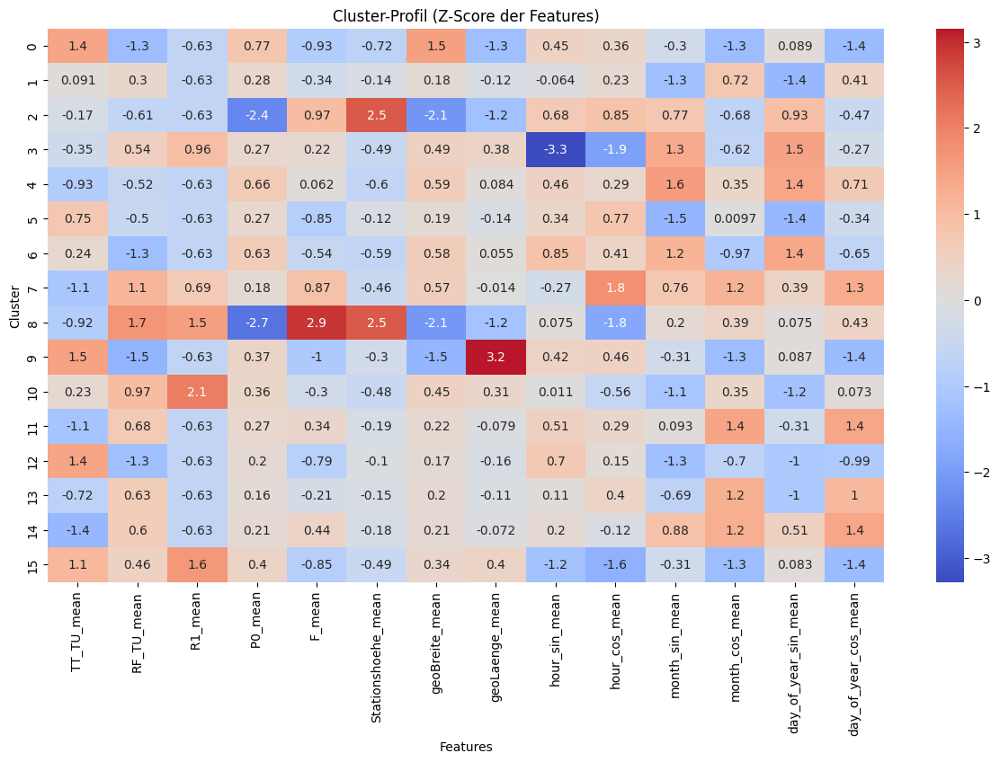

In [95]:
feature_cols = [col for col in summary_df.columns if summary_df[col].dtype != 'object' and 'ci' not in col and col != 'Cluster']

# Cluster-Mittelwerte
cluster_means = summary_df[feature_cols]
cluster_means.index = summary_df['Cluster']  # Index auf Cluster setzen

# Z-Score Berechnung pro Feature über alle Cluster
z_scores = (cluster_means - cluster_means.mean()) / cluster_means.std()

# Heatmap plotten
plt.figure(figsize=(15,8))
sns.heatmap(z_scores, annot=True, cmap="coolwarm", center=0)
plt.title("Cluster-Profil (Z-Score der Features)")
plt.xlabel("Features")
plt.ylabel("Cluster")
plt.show()

In [96]:
#Erfurt-Weimar

In [97]:
X= models['Erfurt-Weimar']['scaler'].transform(trainErfurtWeimarDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).values)
labels= models['Erfurt-Weimar']['gmm'].predict(X)
XOriginal= models['Erfurt-Weimar']['scaler'].inverse_transform(X)

In [98]:
summary_df = cluster_summary_bootstrap(XOriginal, labels, lastYearGeneratedDf.columns)

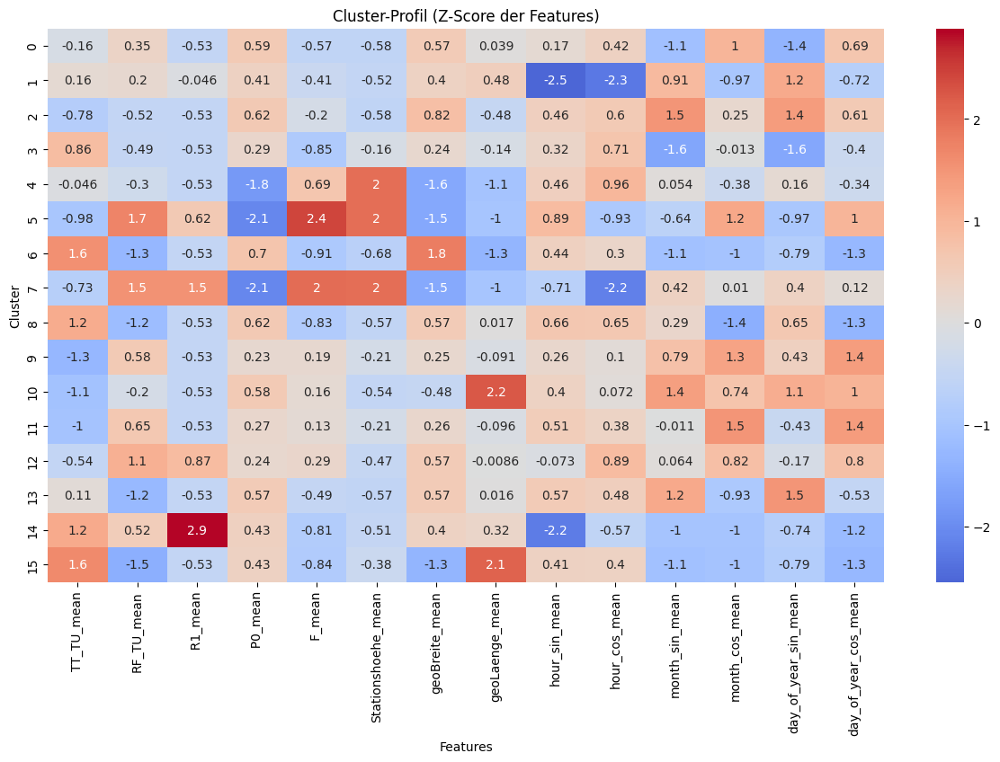

In [99]:
feature_cols = [col for col in summary_df.columns if summary_df[col].dtype != 'object' and 'ci' not in col and col != 'Cluster']

# Cluster-Mittelwerte
cluster_means = summary_df[feature_cols]
cluster_means.index = summary_df['Cluster']  # Index auf Cluster setzen

# Z-Score Berechnung pro Feature über alle Cluster
z_scores = (cluster_means - cluster_means.mean()) / cluster_means.std()

# Heatmap plotten
plt.figure(figsize=(15,8))
sns.heatmap(z_scores, annot=True, cmap="coolwarm", center=0)
plt.title("Cluster-Profil (Z-Score der Features)")
plt.xlabel("Features")
plt.ylabel("Cluster")
plt.show()

In [100]:
#Eisenach

In [101]:
X= models['Eisenach']['scaler'].transform(trainEisenachDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).values)
labels= models['Eisenach']['gmm'].predict(X)
XOriginal= models['Eisenach']['scaler'].inverse_transform(X)

In [102]:
summary_df = cluster_summary_bootstrap(XOriginal, labels, lastYearGeneratedDf.columns)

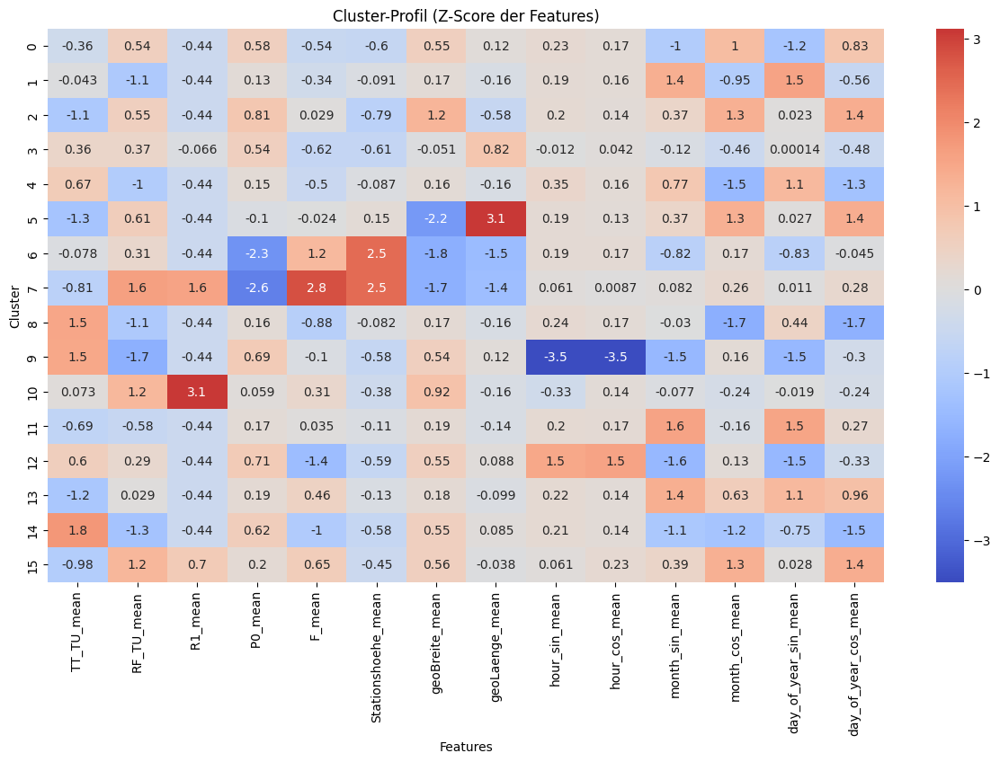

In [103]:
feature_cols = [col for col in summary_df.columns if summary_df[col].dtype != 'object' and 'ci' not in col and col != 'Cluster']

# Cluster-Mittelwerte
cluster_means = summary_df[feature_cols]
cluster_means.index = summary_df['Cluster']  # Index auf Cluster setzen

# Z-Score Berechnung pro Feature über alle Cluster
z_scores = (cluster_means - cluster_means.mean()) / cluster_means.std()

# Heatmap plotten
plt.figure(figsize=(15,8))
sns.heatmap(z_scores, annot=True, cmap="coolwarm", center=0)
plt.title("Cluster-Profil (Z-Score der Features)")
plt.xlabel("Features")
plt.ylabel("Cluster")
plt.show()

In [104]:
#Wasserkuppe

In [105]:
X= models['Wasserkuppe']['scaler'].transform(trainWasserkuppeDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).values)
labels= models['Wasserkuppe']['gmm'].predict(X)
XOriginal= models['Wasserkuppe']['scaler'].inverse_transform(X)

In [106]:
summary_df = cluster_summary_bootstrap(XOriginal, labels, lastYearGeneratedDf.columns)

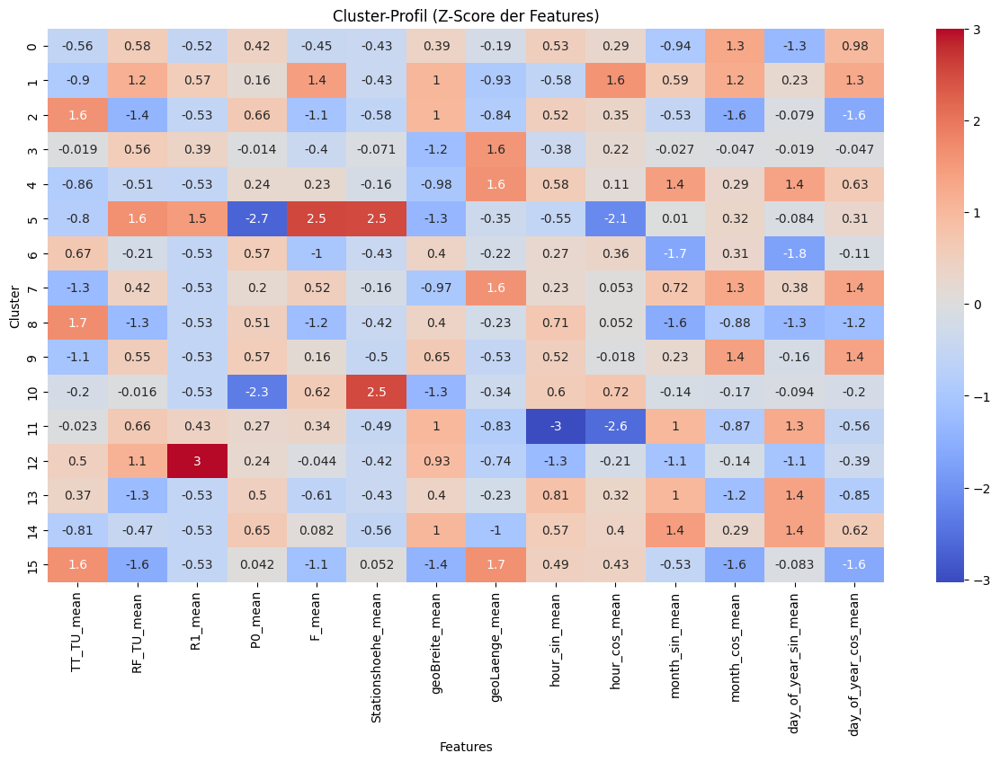

In [107]:
feature_cols = [col for col in summary_df.columns if summary_df[col].dtype != 'object' and 'ci' not in col and col != 'Cluster']

# Cluster-Mittelwerte
cluster_means = summary_df[feature_cols]
cluster_means.index = summary_df['Cluster']  # Index auf Cluster setzen

# Z-Score Berechnung pro Feature über alle Cluster
z_scores = (cluster_means - cluster_means.mean()) / cluster_means.std()

# Heatmap plotten
plt.figure(figsize=(15,8))
sns.heatmap(z_scores, annot=True, cmap="coolwarm", center=0)
plt.title("Cluster-Profil (Z-Score der Features)")
plt.xlabel("Features")
plt.ylabel("Cluster")
plt.show()

In [108]:
#QDA

In [109]:
#LastYear

In [110]:
trainDf= trainLastYearDf.drop(columns= ['MESS_DATUM','Stationsname', 'hour', 'day', 'month'])
X= models['LastYear']['scaler'].transform(trainDf.values)

In [111]:
qda_model = evaluate_qda_on_gmm(X, models['LastYear']['gmm'])

=== QDA Evaluation gegen GMM Cluster ===
Accuracy : 0.926
Precision: 0.928
Recall   : 0.926
F1 Score : 0.914

Detail Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98    134009
           1       0.92      0.99      0.95    111059
           2       0.93      0.99      0.96    102783
           3       0.97      0.39      0.56     31475
           4       0.93      1.00      0.96    181557
           5       0.95      0.99      0.97    111796
           6       0.94      0.99      0.97    191276
           7       0.99      0.39      0.56     42926
           8       0.70      0.66      0.68     36435
           9       0.90      1.00      0.95     58327
          10       0.96      0.38      0.54     44829
          11       0.90      0.98      0.94    106989
          12       0.94      0.99      0.97    114744
          13       0.92      0.98      0.95    107864
          14       0.90      0.97      0.93    104411
          

In [112]:
#Erfurt-Weimar

In [113]:
trainDf= trainErfurtWeimarDf.drop(columns= ['MESS_DATUM','Stationsname', 'hour', 'day', 'month'])
X= models['LastYear']['scaler'].transform(trainDf.values)

In [114]:
qda_model = evaluate_qda_on_gmm(X, models['Erfurt-Weimar']['gmm'])

=== QDA Evaluation gegen GMM Cluster ===
Accuracy : 0.785
Precision: 0.842
Recall   : 0.785
F1 Score : 0.773

Detail Report:
              precision    recall  f1-score   support

           0       0.52      0.99      0.68    101836
           1       0.91      0.80      0.85    300293
           2       0.63      0.95      0.76     94702
           3       0.94      0.99      0.97    118105
           6       0.64      1.00      0.78     80643
           8       0.71      0.91      0.80     75781
           9       0.88      0.99      0.93    109504
          10       0.83      0.99      0.91     36237
          11       0.89      0.99      0.94    111371
          12       0.97      0.42      0.59    305262
          13       0.80      0.81      0.81     53474
          14       0.94      0.45      0.61    142174
          15       0.60      1.00      0.75     48282

    accuracy                           0.78   1577664
   macro avg       0.79      0.87      0.80   1577664
weighted 

In [115]:
#Eisenach

In [116]:
trainDf= trainEisenachDf.drop(columns= ['MESS_DATUM','Stationsname', 'hour', 'day', 'month'])
X= models['Eisenach']['scaler'].transform(trainDf.values)

In [117]:
qda_model = evaluate_qda_on_gmm(X, models['Eisenach']['gmm'])

=== QDA Evaluation gegen GMM Cluster ===
Accuracy : 0.909
Precision: 0.887
Recall   : 0.909
F1 Score : 0.890

Detail Report:
              precision    recall  f1-score   support

           0       0.87      0.91      0.89    132597
           1       0.94      0.99      0.96    116984
           2       0.91      1.00      0.95    151886
           3       0.22      0.01      0.02     53246
           4       0.94      0.99      0.97    120686
           5       0.85      1.00      0.92     37072
           6       0.91      0.99      0.95    127388
           7       0.79      0.65      0.71     41957
           8       0.95      0.99      0.97    118578
           9       0.77      0.98      0.86     44155
          10       0.97      0.60      0.74     60091
          11       0.92      0.99      0.95    116910
          12       0.88      0.92      0.90    114984
          13       0.92      0.98      0.95    105828
          14       0.94      1.00      0.97    201697
          

In [118]:
#Wasserkuppe

In [119]:
trainDf= trainWasserkuppeDf.drop(columns= ['MESS_DATUM','Stationsname', 'hour', 'day', 'month'])
X= models['Wasserkuppe']['scaler'].transform(trainDf.values)

In [120]:
qda_model = evaluate_qda_on_gmm(X, models['Wasserkuppe']['gmm'])

=== QDA Evaluation gegen GMM Cluster ===
Accuracy : 0.926
Precision: 0.926
Recall   : 0.926
F1 Score : 0.915

Detail Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98    105997
           1       0.93      0.43      0.59     34845
           2       0.96      0.95      0.95    161228
           3       0.81      0.28      0.41     42303
           4       0.90      1.00      0.95     62264
           5       0.94      0.58      0.72     28935
           6       0.94      1.00      0.97    210377
           7       0.88      1.00      0.94     31587
           8       0.94      1.00      0.97    107138
           9       0.91      1.00      0.95    170249
          10       0.92      0.99      0.96    146069
          11       0.92      0.37      0.53     26063
          12       0.95      0.50      0.66     46802
          13       0.95      0.99      0.97    212450
          14       0.93      1.00      0.96    138540
          

In [121]:
#Problaistische Bewertung

In [122]:
#Entropie

In [123]:
stations= ['Eisenach', 'Erfurt-Weimar', 'Wasserkuppe', 'LastYear']
postions= [[316, 50.9829, 10.9608], [312.0, 51.0007, 10.3621], [920.0, 50.4973, 9.9427], None]
df_analysis = []

for i, sample in enumerate(stations):
    test_df = rowwiseDf.loc[datasetsIdx[sample]["test_idx"]]
    test_df= test_df.drop(columns=['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month'])
    X_test = test_df.values
    X_scaled = models[sample]["scaler"].transform(X_test)
    gmm = models[sample]["gmm"]

    # Generierte Samples
    n_gen_samples = len(X_test)  # gleiche Anzahl wie Testdaten
    # Hier: generiere zufällig aus GMM, oder nutze conditionalSampleGeneration falls gewünscht
    if postions[i] == None:
        X_gen_scaled= gmm.sample(n_gen_samples)[0]
    else:
        X_gen_scaled = conditionalSampleGeneration(gmm, postions[i], [5,6,7], test_df.columns, scaler, len(test_df.index))  # bereits skaliert im Fall von gmm.sample


    # --- 1) Log-Likelihood pro Sample ---
    log_likelihoods = gmm.score_samples(X_scaled)
    log_likelihoodsGen = gmm.score_samples(X_gen_scaled)

    # --- 2) Posterior Wahrscheinlichkeiten ---
    responsibilities = gmm.predict_proba(X_scaled)
    responsibilitiesGen = gmm.predict_proba(X_gen_scaled)

    # --- 3) Entropie der Posterior-Wahrscheinlichkeiten ---
    entropies = entropy(responsibilities.T)  # scipy erwartet Transponierte
    entropiesGen = entropy(responsibilitiesGen.T)

    # Alles in ein DataFrame packen
    tmpDf = pd.DataFrame({
        "log_likelihood": log_likelihoods,
        "log_likelihoodGen": log_likelihoodsGen,
        "entropy": entropies,
        "entropyGen": entropiesGen,
        "cluster": gmm.predict(X_scaled),
        "clusterGen": gmm.predict(X_gen_scaled),
        "station": sample

    })
    df_analysis.append(tmpDf)

df_analysis = pd.concat(df_analysis, ignore_index=True)

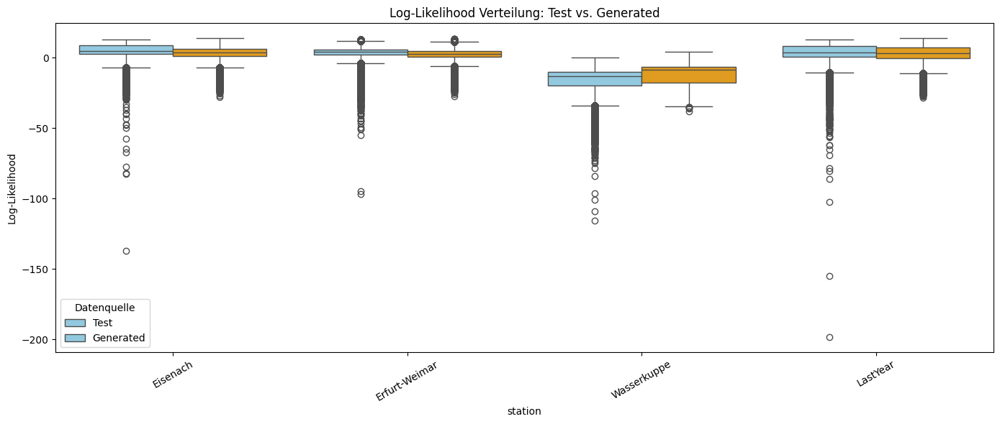

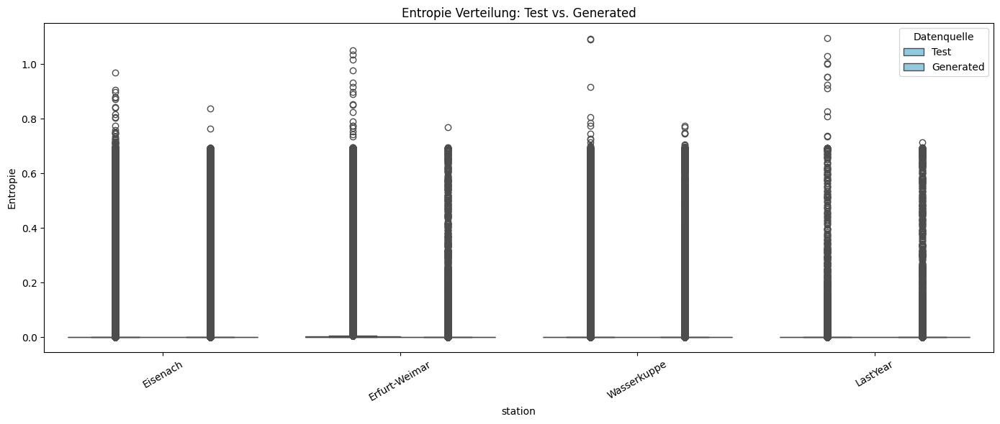

In [124]:
# Boxplot für Log-Likelihood
plt.figure(figsize=(14,6))
plot_df = df_analysis.melt(
    id_vars=["station"], 
    value_vars=["log_likelihood", "log_likelihoodGen"], 
    var_name="type", value_name="value"
)

sns.boxplot(
    data=plot_df,
    x="station", y="value", hue="type",
    palette={"log_likelihood":"skyblue", "log_likelihoodGen":"orange"}
)
plt.title("Log-Likelihood Verteilung: Test vs. Generated")
plt.ylabel("Log-Likelihood")
plt.xticks(rotation=30)
plt.legend(title="Datenquelle", labels=["Test", "Generated"])
plt.tight_layout()
plt.show()


# Boxplot für Entropie
plt.figure(figsize=(14,6))
plot_df = df_analysis.melt(
    id_vars=["station"], 
    value_vars=["entropy", "entropyGen"], 
    var_name="type", value_name="value"
)

sns.boxplot(
    data=plot_df,
    x="station", y="value", hue="type",
    palette={"entropy":"skyblue", "entropyGen":"orange"}
)
plt.title("Entropie Verteilung: Test vs. Generated")
plt.ylabel("Entropie")
plt.xticks(rotation=30)
plt.legend(title="Datenquelle", labels=["Test", "Generated"])
plt.tight_layout()
plt.show()

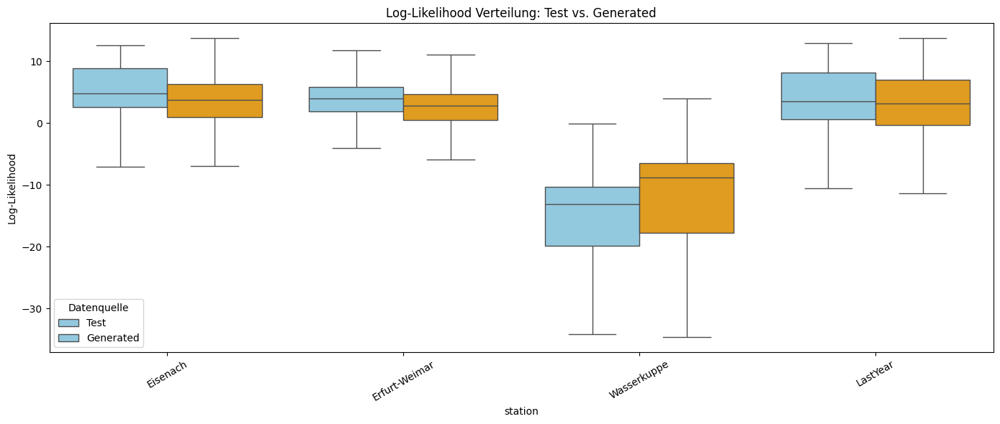

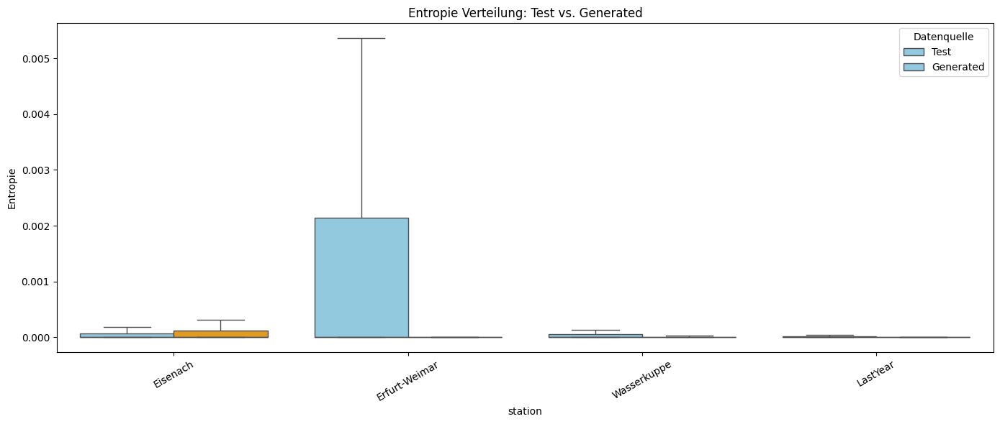

In [125]:
# Boxplot für Log-Likelihood
plt.figure(figsize=(14,6))
plot_df = df_analysis.melt(
    id_vars=["station"], 
    value_vars=["log_likelihood", "log_likelihoodGen"], 
    var_name="type", value_name="value"
)

sns.boxplot(
    data=plot_df,
    x="station", y="value", hue="type",
    palette={"log_likelihood":"skyblue", "log_likelihoodGen":"orange"},
    showfliers=False
)
plt.title("Log-Likelihood Verteilung: Test vs. Generated")
plt.ylabel("Log-Likelihood")
plt.xticks(rotation=30)
plt.legend(title="Datenquelle", labels=["Test", "Generated"])
plt.tight_layout()
plt.show()


# Boxplot für Entropie
plt.figure(figsize=(14,6))
plot_df = df_analysis.melt(
    id_vars=["station"], 
    value_vars=["entropy", "entropyGen"], 
    var_name="type", value_name="value"
)

sns.boxplot(
    data=plot_df,
    x="station", y="value", hue="type",
    palette={"entropy":"skyblue", "entropyGen":"orange"},
    showfliers=False
)
plt.title("Entropie Verteilung: Test vs. Generated")
plt.ylabel("Entropie")
plt.xticks(rotation=30)
plt.legend(title="Datenquelle", labels=["Test", "Generated"])
plt.tight_layout()
plt.show()

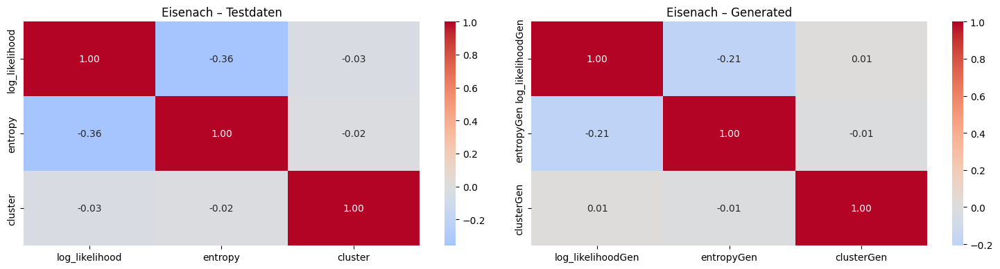

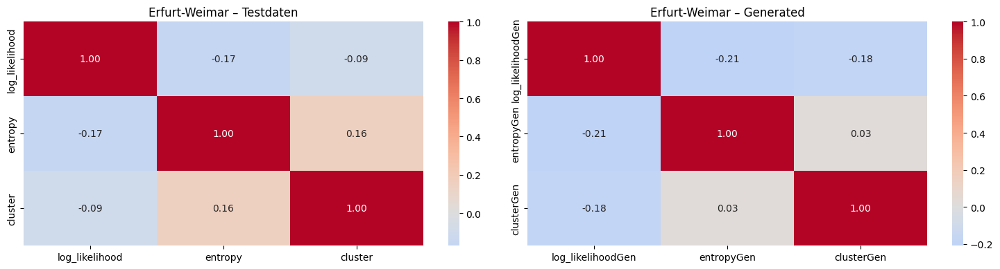

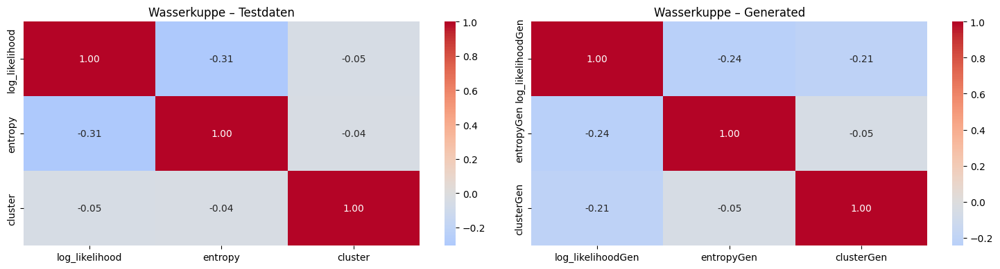

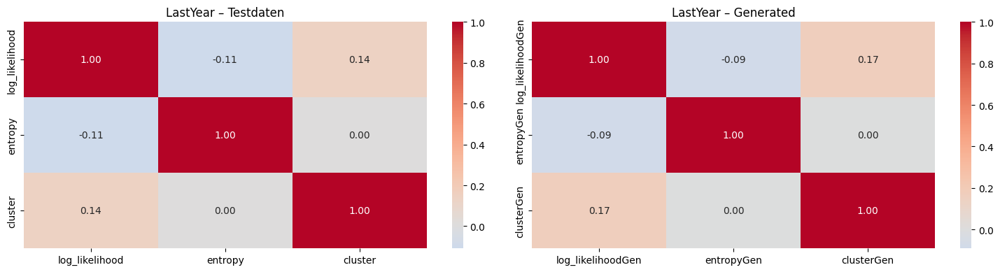

In [126]:
for sample in stations:
    df_station = df_analysis[df_analysis["station"] == sample]

    # Testdaten
    corr_test = df_station[["log_likelihood", "entropy", "cluster"]].corr()
    # Generated Daten
    corr_gen = df_station[["log_likelihoodGen", "entropyGen", "clusterGen"]].corr()
    # Alles zusammen (auf gleiche Namensbasis gebracht)
    df_station_renamed = df_station.rename(
        columns={
            "log_likelihoodGen":"log_likelihood",
            "entropyGen":"entropy",
            "clusterGen":"cluster"
        }
    )

    fig, axs = plt.subplots(1, 2, figsize=(15,4))

    sns.heatmap(corr_test, annot=True, cmap="coolwarm", center=0, fmt=".2f", ax=axs[0])
    axs[0].set_title(f"{sample} – Testdaten")

    sns.heatmap(corr_gen, annot=True, cmap="coolwarm", center=0, fmt=".2f", ax=axs[1])
    axs[1].set_title(f"{sample} – Generated")

    plt.tight_layout()
    plt.show()

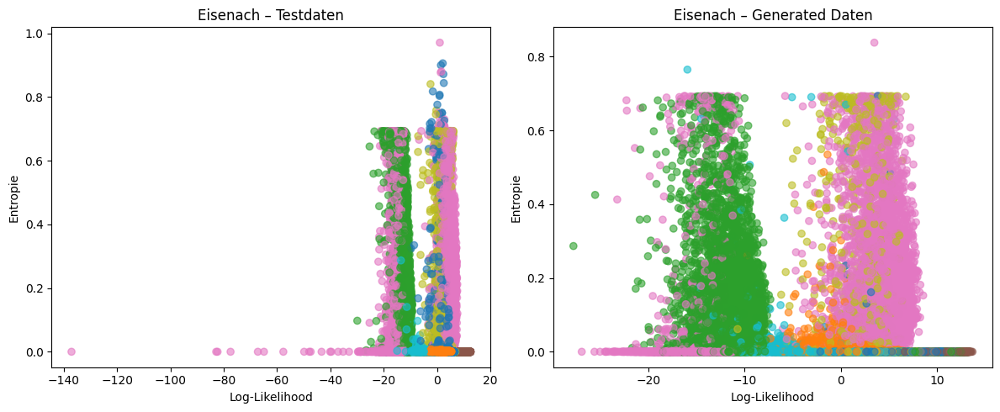

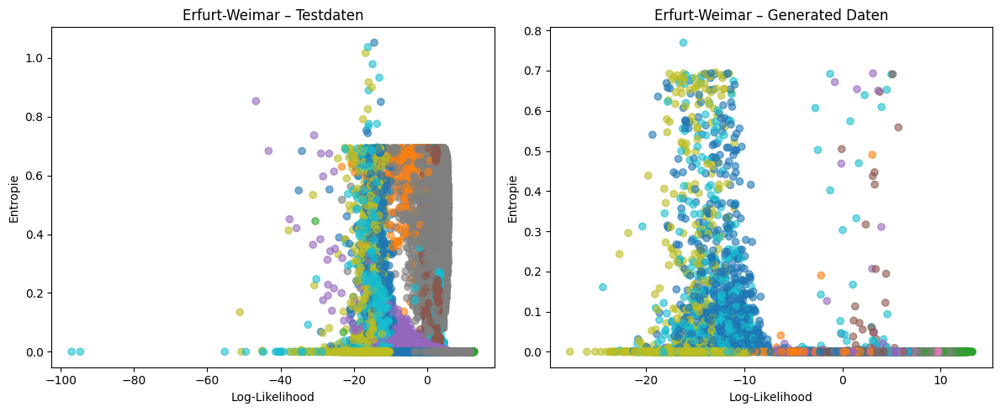

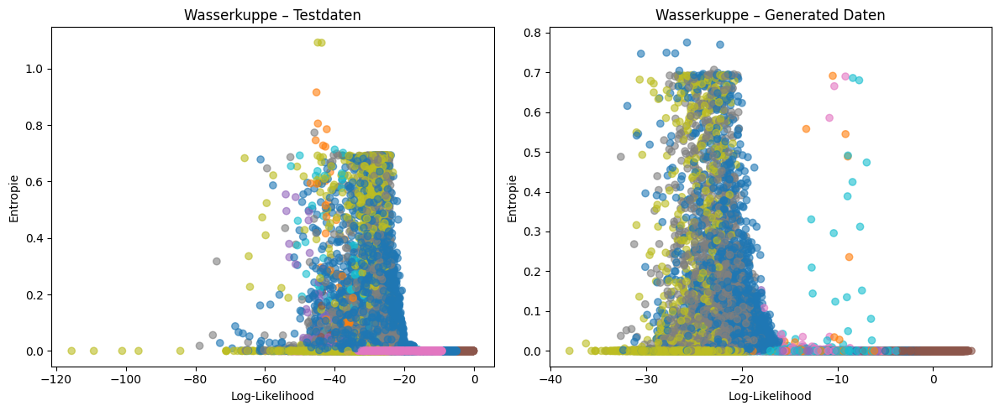

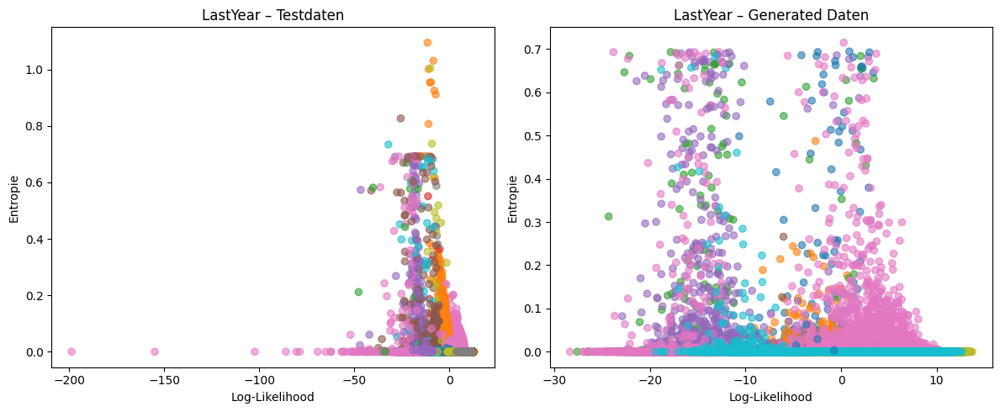

In [127]:
for station in df_analysis["station"].unique():
    tmp = df_analysis[df_analysis["station"] == station]
    
    fig, axs = plt.subplots(1, 2, figsize=(12,5))
    
    axs[0].scatter(
        tmp["log_likelihood"], tmp["entropy"], 
        c=tmp["cluster"], cmap="tab10", alpha=0.6
    )
    axs[0].set_title(f"{station} – Testdaten")
    axs[0].set_xlabel("Log-Likelihood")
    axs[0].set_ylabel("Entropie")

    axs[1].scatter(
        tmp["log_likelihoodGen"], tmp["entropyGen"], 
        c=tmp["clusterGen"], cmap="tab10", alpha=0.6
    )
    axs[1].set_title(f"{station} – Generated Daten")
    axs[1].set_xlabel("Log-Likelihood")
    axs[1].set_ylabel("Entropie")
    
    plt.tight_layout()
    plt.show()

In [128]:
#Confidence Interval für ein Sample

In [129]:
#Visualisierungen

In [130]:
#Timesieres eignung

In [131]:
#LastYear

In [132]:
day= 210
#Stationlocation
condValues=[344, 50.3066, 10.9679]
targets= ['TT_TU', 'RF_TU', '  R1', '  P0', '   F']
idxCond= [5, 6, 7]
idxDay= [8, 9, 10, 11, 12, 13]


In [133]:
rowwiseDf['MESS_DATUM'] = pd.to_datetime(rowwiseDf['MESS_DATUM'], format='%Y%m%d')

# Letztes Jahr im Datensatz
letztes_jahr = rowwiseDf['MESS_DATUM'].dt.year.max()
tmpDf = rowwiseDf[rowwiseDf['MESS_DATUM'].dt.year == letztes_jahr]

realDayDf= inverse_cyclical(tmpDf)
realDayDf= realDayDf[realDayDf['day_of_year'] == day]
realDayDf= realDayDf[(realDayDf['Stationshoehe']==344) & (realDayDf['geoBreite']==50.3066) & (realDayDf['geoLaenge']==10.9679)]

In [134]:
dayCondList = dayConditions(day)
tmpValues = condValues
tmpIdx = idxCond

condValuesList = []
idxCondList = []

for dayCond in dayCondList:
    condValues = []
    idxCond = []

    for i in range(len(rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns)):
        if i in tmpIdx:
            idx = tmpIdx.index(i)
            condValues.append(tmpValues[idx])
            idxCond.append(i)

        elif i in idxDay:
            idx = idxDay.index(i)
            condValues.append(dayCond[idx])
            idxCond.append(i)

    condValuesList.append(condValues)
    idxCondList.append(idxCond)     

In [135]:
samples= []
for i in range(len(idxCondList)):
    samples.append(conditionalSampleGeneration(gmm, condValuesList[i], idxCondList[i], rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns, models['LastYear']['scaler'], 1))

samples = np.vstack(samples)

In [136]:
samplesOriginal= models['LastYear']['scaler'].inverse_transform(samples)

In [137]:
fakeCyclic_df = pd.DataFrame(samplesOriginal, columns= rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns)
fake_df= inverse_cyclical(fakeCyclic_df)

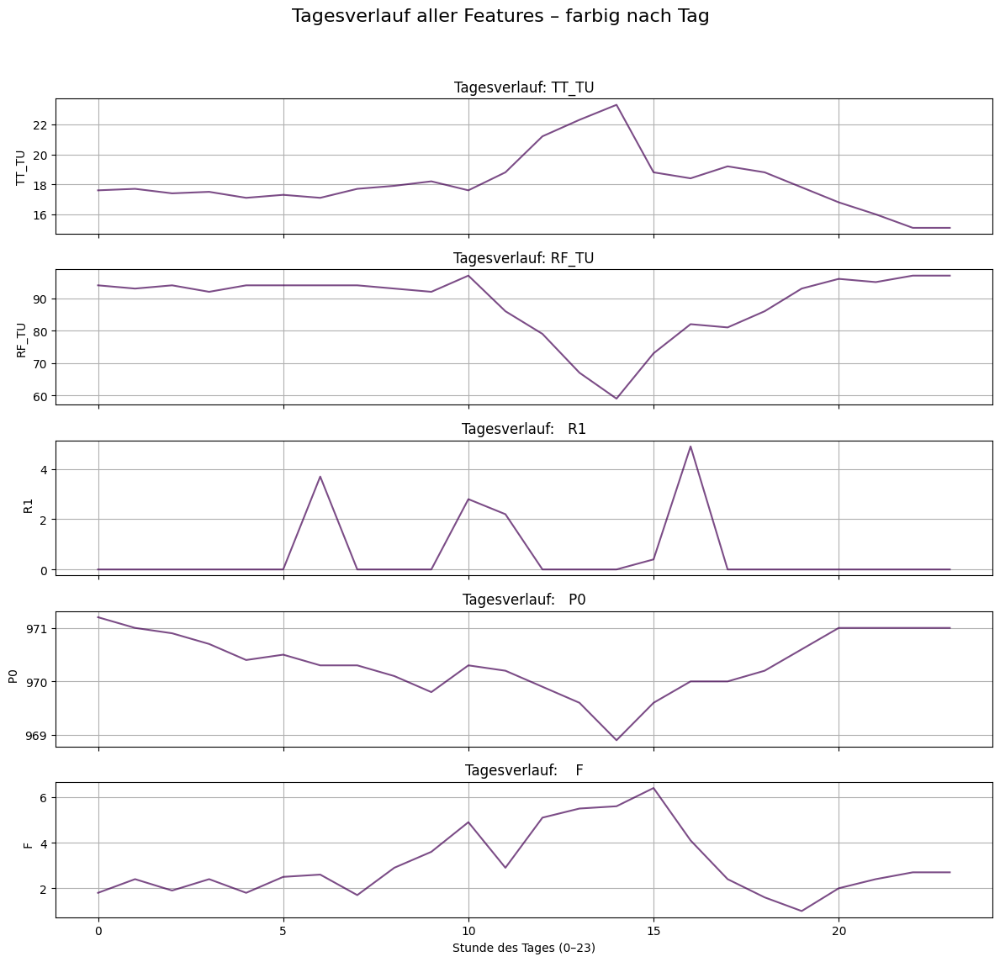

In [138]:
colors = cm.viridis(np.linspace(0, 1, 1))

fig, axs = plt.subplots(5, 1, figsize=(12, 12), sharex=True)
grouped = realDayDf.groupby('day_of_year')
for i, target in enumerate(targets):
    for day_id, (day, group) in enumerate(grouped):
        axs[i].plot(group['hour'], group[target], color=colors[day_id], alpha=0.7)
    
    axs[i].set_ylabel(target)
    axs[i].set_title(f"Tagesverlauf: {target}")
    axs[i].grid(True)

axs[-1].set_xlabel("Stunde des Tages (0–23)")
plt.suptitle("Tagesverlauf aller Features – farbig nach Tag", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

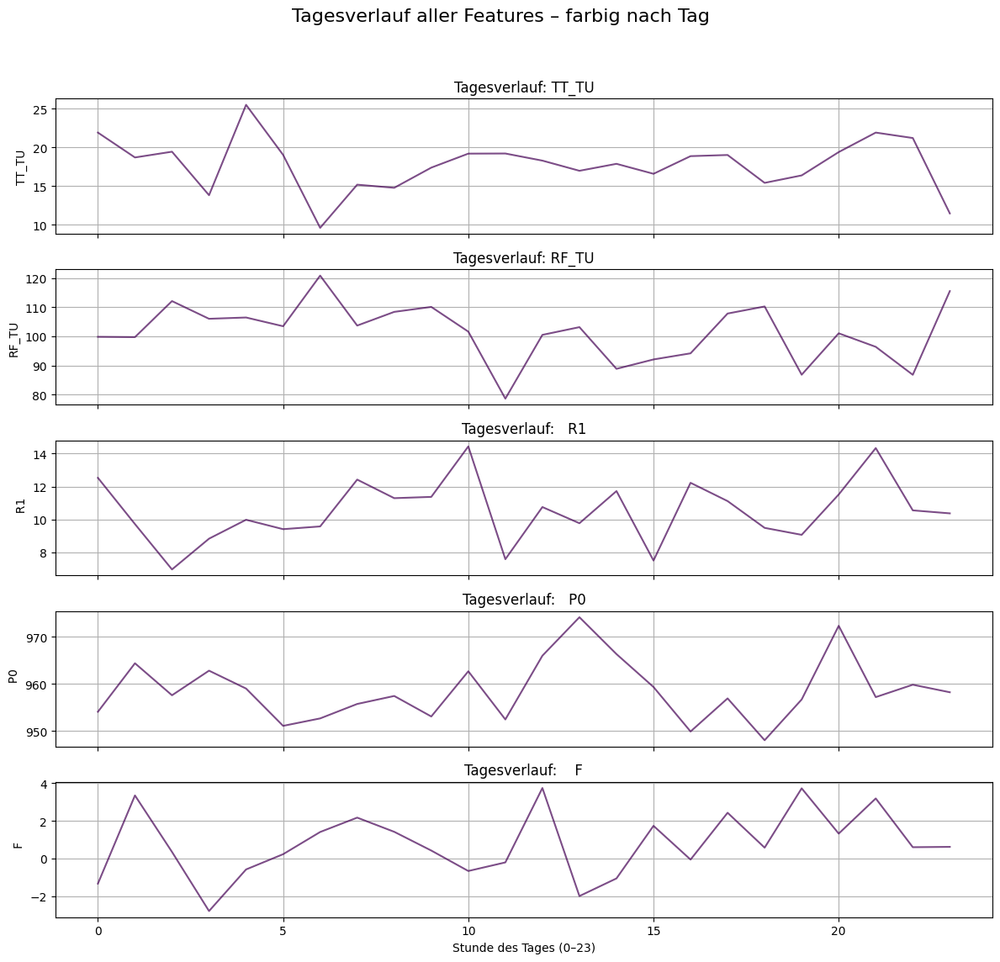

In [139]:
colors = cm.viridis(np.linspace(0, 1, 1))

fig, axs = plt.subplots(5, 1, figsize=(12, 12), sharex=True)

grouped = fake_df.groupby('day_of_year')
for i, target in enumerate(targets):
    for day_id, (day, group) in enumerate(grouped):
        axs[i].plot(group['hour'], group[target], color=colors[day_id], alpha=0.7)
    
    axs[i].set_ylabel(target)
    axs[i].set_title(f"Tagesverlauf: {target}")
    axs[i].grid(True)

axs[-1].set_xlabel("Stunde des Tages (0–23)")
plt.suptitle("Tagesverlauf aller Features – farbig nach Tag", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [140]:
#Erfurt-Weimar

In [141]:
day= 210
#Stationlocation
condValues=[316, 50.9829, 10.9608]
targets= ['TT_TU', 'RF_TU', '  R1', '  P0', '   F']
idxCond= [5, 6, 7]
idxDay= [8, 9, 10, 11, 12, 13]

In [142]:
tmpDf = rowwiseDf
realDayDf= inverse_cyclical(tmpDf)
realDayDf= realDayDf[realDayDf['day_of_year'] == day]
realDayDf= realDayDf[(realDayDf['Stationshoehe']==316) & (realDayDf['geoBreite']==50.9829) & (realDayDf['geoLaenge']==10.9608)]
realDayDf= realDayDf.copy()
realDayDf['Year'] = np.repeat(np.arange(10), 24)

In [143]:
dayCondList = dayConditions(day)
tmpValues = condValues
tmpIdx = idxCond

condValuesList = []
idxCondList = []

for dayCond in dayCondList:
    condValues = []
    idxCond = []

    for i in range(len(rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns)):
        if i in tmpIdx:
            idx = tmpIdx.index(i)
            condValues.append(tmpValues[idx])
            idxCond.append(i)

        elif i in idxDay:
            idx = idxDay.index(i)
            condValues.append(dayCond[idx])
            idxCond.append(i)

    condValuesList.append(condValues)
    idxCondList.append(idxCond)     

In [144]:
samples= []
for i in range(len(idxCondList)):
    samples.append(conditionalSampleGeneration(gmm, condValuesList[i], idxCondList[i], rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns, models['Erfurt-Weimar']['scaler'], 10))

samples = np.vstack(samples)

In [145]:
samplesOriginal= models['Erfurt-Weimar']['scaler'].inverse_transform(samples)

In [146]:
fakeCyclic_df = pd.DataFrame(samplesOriginal, columns= rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns)
fake_df= inverse_cyclical(fakeCyclic_df)
fake_df['Year'] = np.tile(np.arange(10), 24)

fake_df = fake_df.sort_values(by=['Year', 'hour']).reset_index(drop=True)

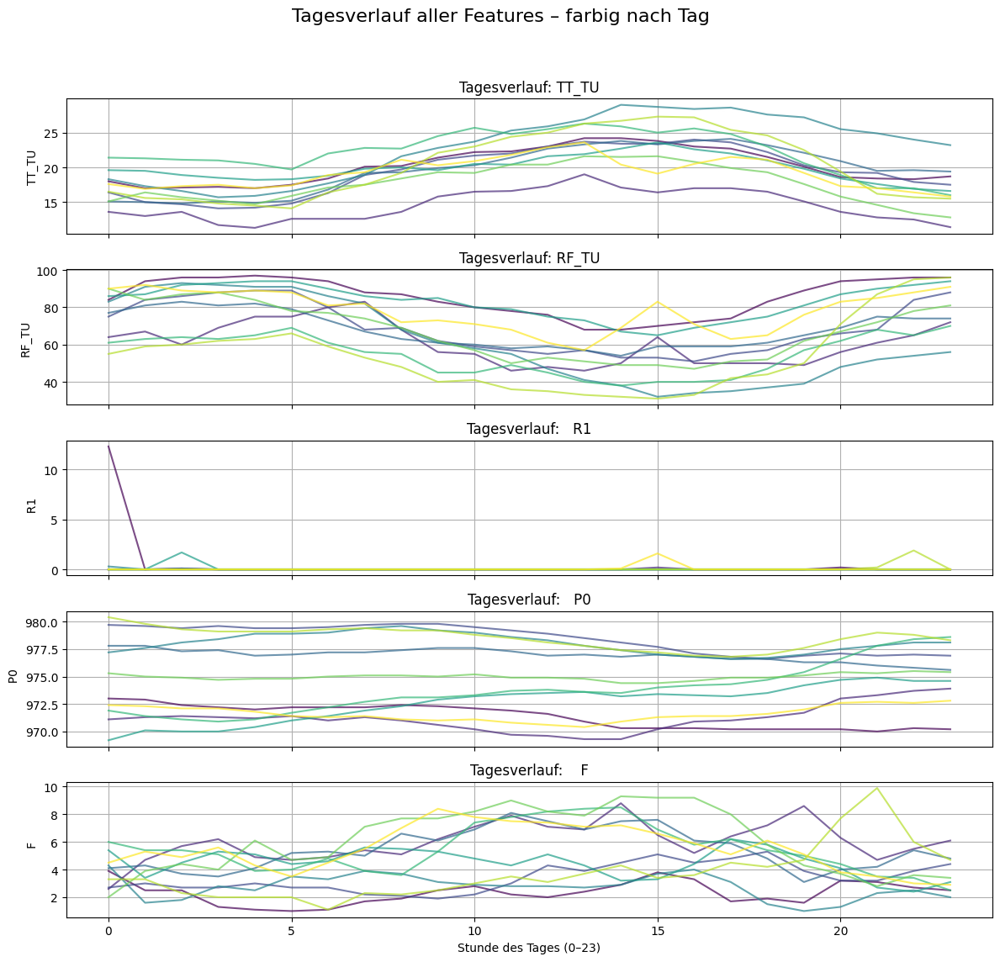

In [147]:
colors = cm.viridis(np.linspace(0, 1, 10))

fig, axs = plt.subplots(5, 1, figsize=(12, 12), sharex=True)
for i, target in enumerate(targets):
    for day_id, (day, group) in enumerate(realDayDf.groupby('Year')):
        axs[i].plot(group['hour'], group[target], color=colors[day_id], alpha=0.7)
    
    axs[i].set_ylabel(target)
    axs[i].set_title(f"Tagesverlauf: {target}")
    axs[i].grid(True)

axs[-1].set_xlabel("Stunde des Tages (0–23)")
plt.suptitle("Tagesverlauf aller Features – farbig nach Tag", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

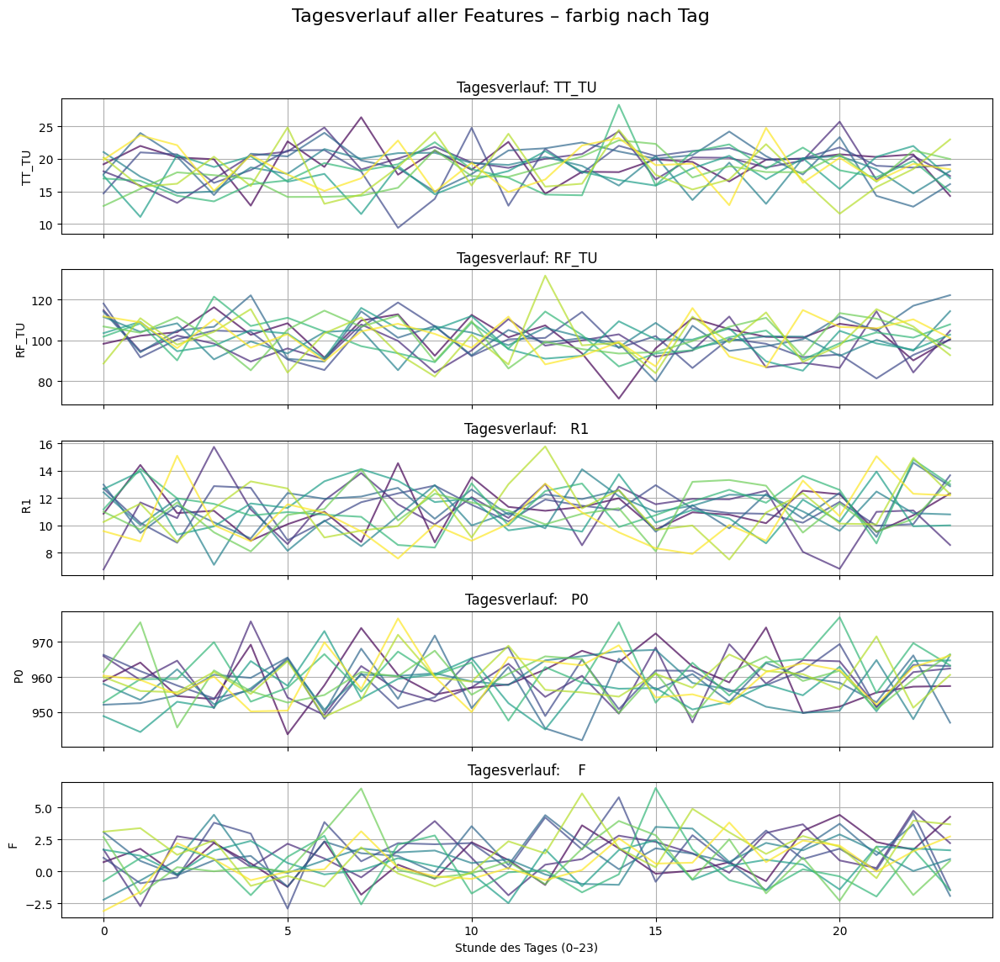

In [148]:
colors = cm.viridis(np.linspace(0, 1, 10))

fig, axs = plt.subplots(5, 1, figsize=(12, 12), sharex=True)

for i, target in enumerate(targets):
    for day_id, (day, group) in enumerate(fake_df.groupby('Year')):
        axs[i].plot(group['hour'], group[target], color=colors[day_id], alpha=0.7)
    
    axs[i].set_ylabel(target)
    axs[i].set_title(f"Tagesverlauf: {target}")
    axs[i].grid(True)

axs[-1].set_xlabel("Stunde des Tages (0–23)")
plt.suptitle("Tagesverlauf aller Features – farbig nach Tag", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [149]:
#Eisenach

In [150]:
day= 210
#Stationlocation
condValues=[312.0, 51.0007, 10.3621]
targets= ['TT_TU', 'RF_TU', '  R1', '  P0', '   F']
idxCond= [5, 6, 7]
idxDay= [8, 9, 10, 11, 12, 13]

In [151]:
tmpDf = rowwiseDf
realDayDf= inverse_cyclical(tmpDf)
realDayDf= realDayDf[realDayDf['day_of_year'] == day]
realDayDf= realDayDf[(realDayDf['Stationshoehe']==312.0) & (realDayDf['geoBreite']==51.0007) & (realDayDf['geoLaenge']==10.3621)]
realDayDf= realDayDf.copy()
realDayDf['Year'] = np.repeat(np.arange(10), 24)

In [152]:
dayCondList = dayConditions(day)
tmpValues = condValues
tmpIdx = idxCond

condValuesList = []
idxCondList = []

for dayCond in dayCondList:
    condValues = []
    idxCond = []

    for i in range(len(rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns)):
        if i in tmpIdx:
            idx = tmpIdx.index(i)
            condValues.append(tmpValues[idx])
            idxCond.append(i)

        elif i in idxDay:
            idx = idxDay.index(i)
            condValues.append(dayCond[idx])
            idxCond.append(i)

    condValuesList.append(condValues)
    idxCondList.append(idxCond)     

In [153]:
samples= []
for i in range(len(idxCondList)):
    samples.append(conditionalSampleGeneration(gmm, condValuesList[i], idxCondList[i], rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns, models['Eisenach']['scaler'], 10))

samples = np.vstack(samples)

In [154]:
samplesOriginal= models['Eisenach']['scaler'].inverse_transform(samples)

In [155]:
fakeCyclic_df = pd.DataFrame(samplesOriginal, columns= rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns)
fake_df= inverse_cyclical(fakeCyclic_df)
fake_df['Year'] = np.tile(np.arange(10), 24)

fake_df = fake_df.sort_values(by=['Year', 'hour']).reset_index(drop=True)

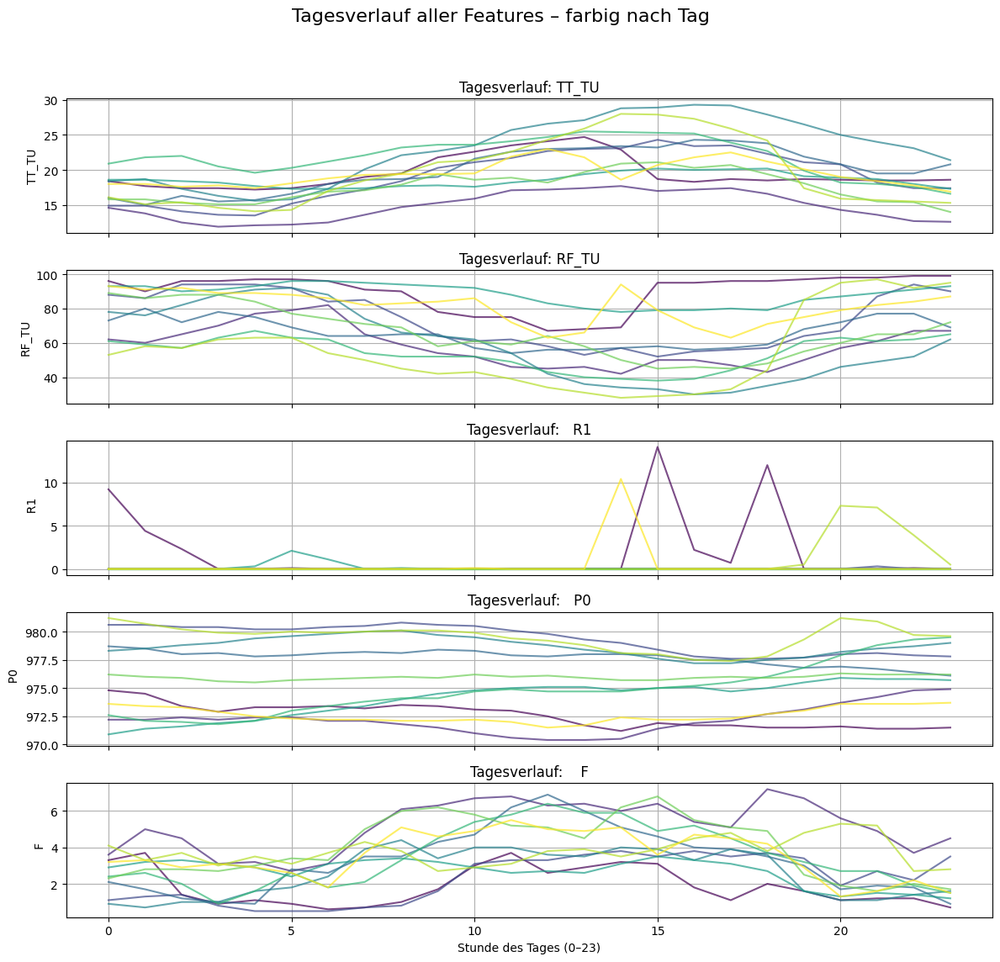

In [156]:
colors = cm.viridis(np.linspace(0, 1, 10))

fig, axs = plt.subplots(5, 1, figsize=(12, 12), sharex=True)
for i, target in enumerate(targets):
    for day_id, (day, group) in enumerate(realDayDf.groupby('Year')):
        axs[i].plot(group['hour'], group[target], color=colors[day_id], alpha=0.7)
    
    axs[i].set_ylabel(target)
    axs[i].set_title(f"Tagesverlauf: {target}")
    axs[i].grid(True)

axs[-1].set_xlabel("Stunde des Tages (0–23)")
plt.suptitle("Tagesverlauf aller Features – farbig nach Tag", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

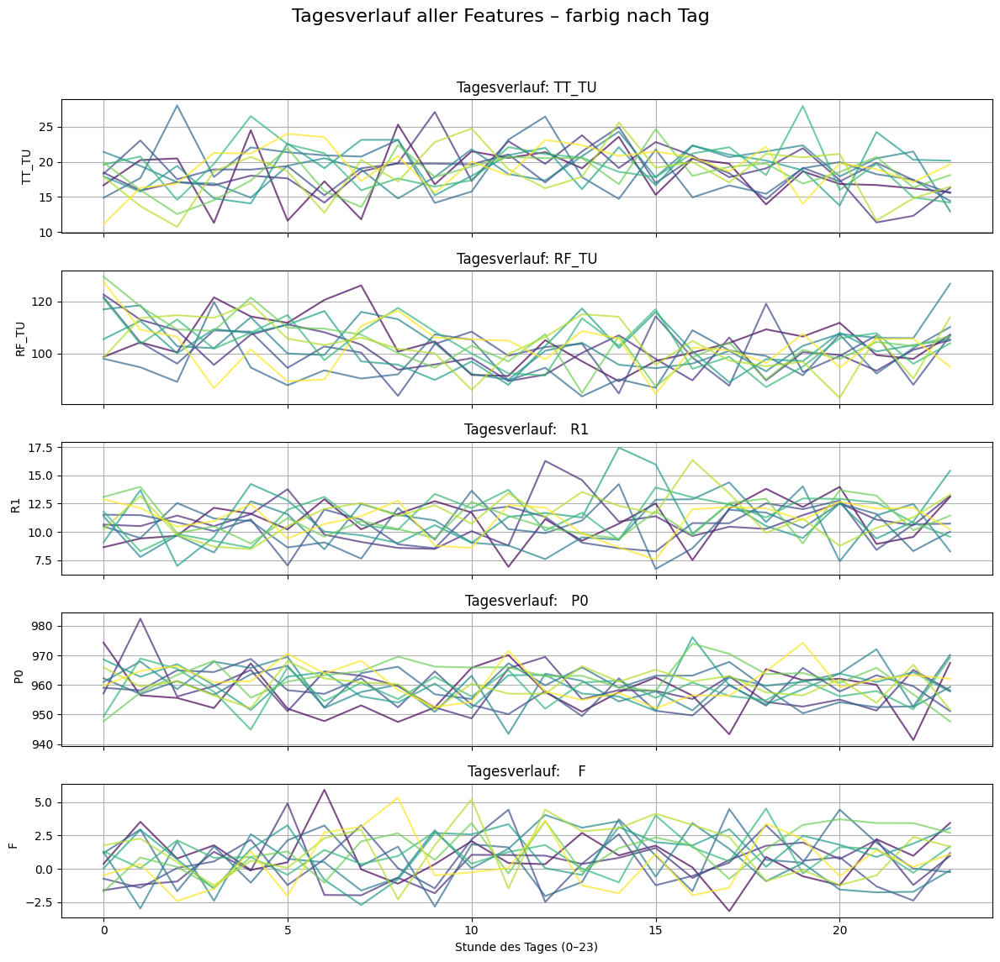

In [157]:
colors = cm.viridis(np.linspace(0, 1, 10))

fig, axs = plt.subplots(5, 1, figsize=(12, 12), sharex=True)

for i, target in enumerate(targets):
    for day_id, (day, group) in enumerate(fake_df.groupby('Year')):
        axs[i].plot(group['hour'], group[target], color=colors[day_id], alpha=0.7)
    
    axs[i].set_ylabel(target)
    axs[i].set_title(f"Tagesverlauf: {target}")
    axs[i].grid(True)

axs[-1].set_xlabel("Stunde des Tages (0–23)")
plt.suptitle("Tagesverlauf aller Features – farbig nach Tag", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [158]:
#Wasserkuppe

In [159]:
day= 210
#Stationlocation
condValues=[920.0, 50.4973, 9.9427]
targets= ['TT_TU', 'RF_TU', '  R1', '  P0', '   F']
idxCond= [5, 6, 7]
idxDay= [8, 9, 10, 11, 12, 13]

In [160]:
tmpDf = rowwiseDf
realDayDf= inverse_cyclical(tmpDf)
realDayDf= realDayDf[realDayDf['day_of_year'] == day]
realDayDf= realDayDf[(realDayDf['Stationshoehe']==920) & (realDayDf['geoBreite']==50.4973) & (realDayDf['geoLaenge']==9.9427)]
realDayDf= realDayDf.copy()
realDayDf['Year'] = np.repeat(np.arange(10), 24)

In [161]:
dayCondList = dayConditions(day)
tmpValues = condValues
tmpIdx = idxCond

condValuesList = []
idxCondList = []

for dayCond in dayCondList:
    condValues = []
    idxCond = []

    for i in range(len(rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns)):
        if i in tmpIdx:
            idx = tmpIdx.index(i)
            condValues.append(tmpValues[idx])
            idxCond.append(i)

        elif i in idxDay:
            idx = idxDay.index(i)
            condValues.append(dayCond[idx])
            idxCond.append(i)

    condValuesList.append(condValues)
    idxCondList.append(idxCond)     

In [162]:
samples= []
for i in range(len(idxCondList)):
    samples.append(conditionalSampleGeneration(gmm, condValuesList[i], idxCondList[i], rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns, models['Wasserkuppe']['scaler'], 10))

samples = np.vstack(samples)

In [163]:
samplesOriginal= models['Wasserkuppe']['scaler'].inverse_transform(samples)

In [164]:
fakeCyclic_df = pd.DataFrame(samplesOriginal, columns= rowwiseDf.drop(columns= ['MESS_DATUM', 'Stationsname', 'hour', 'day', 'month']).columns)
fake_df= inverse_cyclical(fakeCyclic_df)
fake_df['Year'] = np.tile(np.arange(10), 24)

fake_df = fake_df.sort_values(by=['Year', 'hour']).reset_index(drop=True)

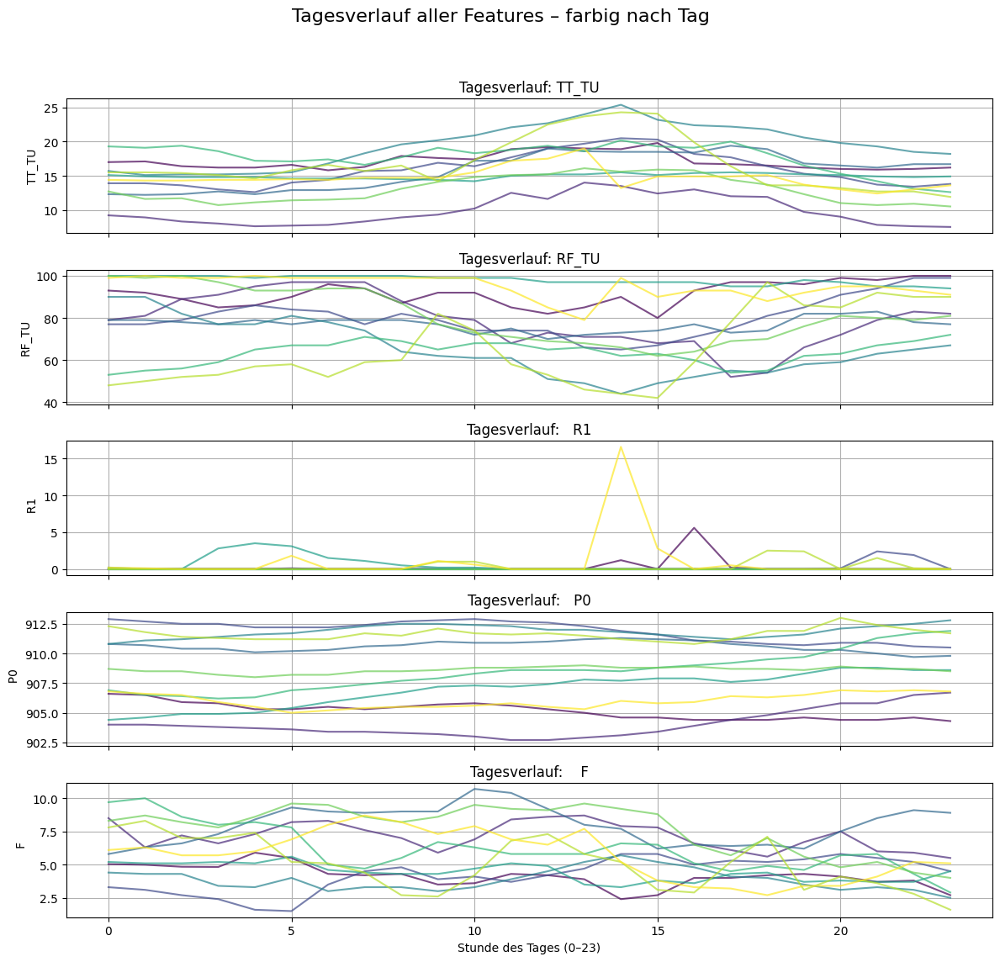

In [165]:
colors = cm.viridis(np.linspace(0, 1, 10))

fig, axs = plt.subplots(5, 1, figsize=(12, 12), sharex=True)
for i, target in enumerate(targets):
    for day_id, (day, group) in enumerate(realDayDf.groupby('Year')):
        axs[i].plot(group['hour'], group[target], color=colors[day_id], alpha=0.7)
    
    axs[i].set_ylabel(target)
    axs[i].set_title(f"Tagesverlauf: {target}")
    axs[i].grid(True)

axs[-1].set_xlabel("Stunde des Tages (0–23)")
plt.suptitle("Tagesverlauf aller Features – farbig nach Tag", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

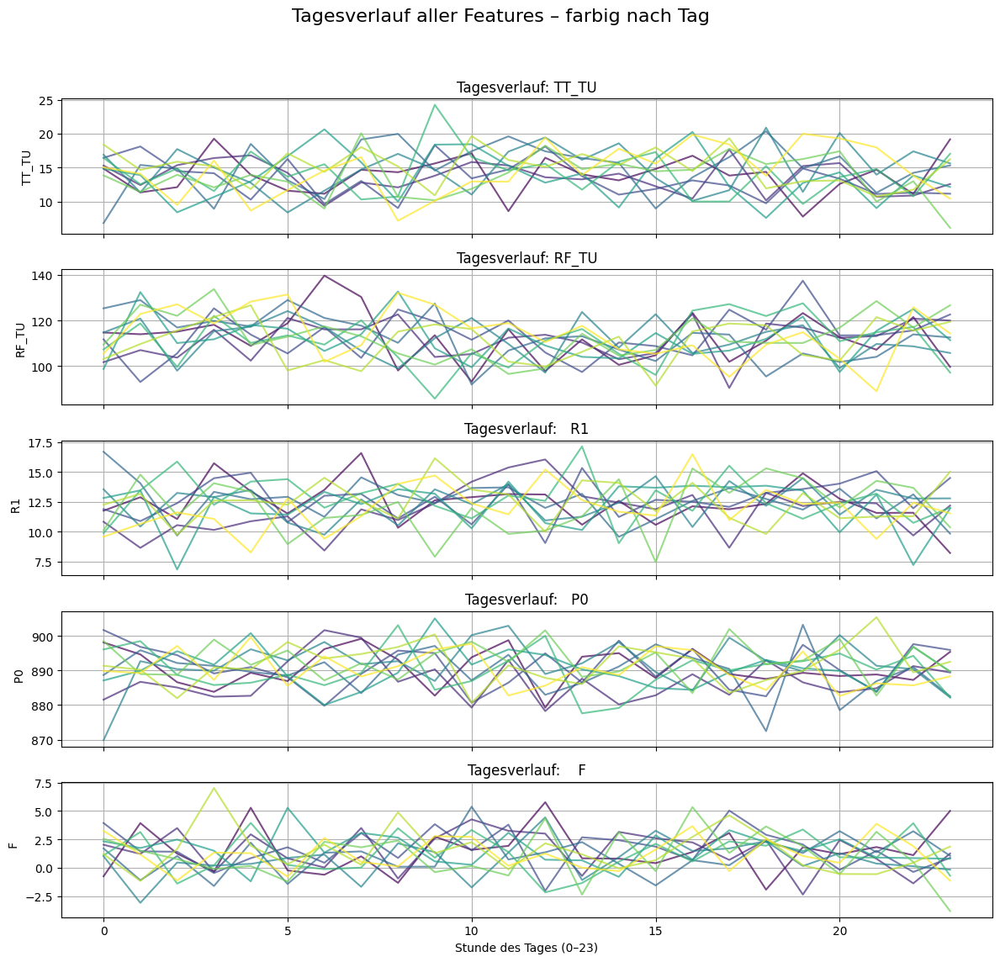

In [166]:
colors = cm.viridis(np.linspace(0, 1, 10))

fig, axs = plt.subplots(5, 1, figsize=(12, 12), sharex=True)

for i, target in enumerate(targets):
    for day_id, (day, group) in enumerate(fake_df.groupby('Year')):
        axs[i].plot(group['hour'], group[target], color=colors[day_id], alpha=0.7)
    
    axs[i].set_ylabel(target)
    axs[i].set_title(f"Tagesverlauf: {target}")
    axs[i].grid(True)

axs[-1].set_xlabel("Stunde des Tages (0–23)")
plt.suptitle("Tagesverlauf aller Features – farbig nach Tag", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()